In [1]:
pip install -U sentence-transformers

   ---------------------------------------- 0.0/199.4 MB ? eta -:--:--
   - -------------------------------------- 8.1/199.4 MB 38.7 MB/s eta 0:00:05
   --- ------------------------------------ 18.9/199.4 MB 45.7 MB/s eta 0:00:04
   ----- ---------------------------------- 25.7/199.4 MB 42.8 MB/s eta 0:00:05
   ----- ---------------------------------- 28.6/199.4 MB 34.2 MB/s eta 0:00:05
   ------ --------------------------------- 31.5/199.4 MB 30.7 MB/s eta 0:00:06
   ------ --------------------------------- 34.1/199.4 MB 27.7 MB/s eta 0:00:06
   ------- -------------------------------- 37.0/199.4 MB 25.5 MB/s eta 0:00:07
   ------- -------------------------------- 39.6/199.4 MB 24.2 MB/s eta 0:00:07
   -------- ------------------------------- 41.7/199.4 MB 22.8 MB/s eta 0:00:07
   -------- ------------------------------- 44.3/199.4 MB 21.5 MB/s eta 0:00:08
   --------- ------------------------------ 46.9/199.4 MB 20.7 MB/s eta 0:00:08
   --------- ------------------------------ 49.5/1

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [2]:
import pandas as pd

from transformers import DistilBertTokenizer
from transformers import TFDistilBertForSequenceClassification
from transformers import TextClassificationPipeline
from transformers import DistilBertForSequenceClassification

import torch
import tensorflow as tf
import pandas as pd
import json
import gc
#import spacy_annotator as spa
#import spacy
##from spacy.util import minibatch, compounding

import numpy as np
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV
#mport statsmodels.api as sm
#import statsmodels.formula.api as smf
%matplotlib inline
from sklearn.preprocessing import LabelEncoder

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics.cluster import adjusted_rand_score

import re
#import nltk
#from nltk.corpus import stopwords
#nltk.download('stopwords')
#stopw = stopwords.words('english')

import seaborn as sns
import matplotlib.pyplot as plt
from plotly.offline import iplot

from tqdm import tqdm
import mpl_toolkits.mplot3d
import numpy as np
from sklearn.cluster import KMeans
from transformers import BartForConditionalGeneration, BartTokenizer, AutoTokenizer,BartForSequenceClassification

from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.common.action_chains import ActionChains
from selenium.webdriver.support import expected_conditions
from selenium.webdriver.support.wait import WebDriverWait
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.common.desired_capabilities import DesiredCapabilities


c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\transformers\utils\generic.py:441: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(
c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\transformers\utils\generic.py:309: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(
c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\transformers\utils\generic.py:309: UserWarning: torch.utils._pytree._register_pytree_node is 

***Ao testar esta primeira versão, usar apenas atributos referentes ao tipo criatura. Generalizarei para as demais cartas nas próximas versões***

# Scraping dos dados

In [3]:
# df_name = pd.read_csv("Names.csv")
# df_name.drop(columns="Unnamed: 0", inplace=True)
# k = df_name.iloc[np.where(df_name['name'].str.contains('//'))]
# k = k.index.to_list()
# for ki in k:
#   nme = df_name.name[ki:ki+1].to_list()
#   for n in nme:
#       nme = n.split('//', 1)
#   df_name[ki:ki+1] = nme[0]

In [4]:
donecards = []
tipos = []
cmcs = []
textos = []
loyals = []
valores = []
raridades = []

In [5]:
def testando():
  driver = webdriver.Chrome()
  cards = df_planes.index.to_list()
  tamanho = len(cards)
  for card in tqdm(cards, desc= "Loop Ligamagic"):
    donecards.append(f'{card}')
    driver.get("https://www.ligamagic.com.br/?view=cards/card&card="+f'{card}')
    driver.set_window_size(1054, 800)
    try:
      to_click = driver.find_elements(By.CLASS_NAME, "mtg-name-aux")
      for t in to_click:
        if(t.get_attribute('innerText') == f'{card}'):
          tref=t.find_element(By.TAG_NAME, 'a')
          tref=tref.get_attribute('href')
          driver.get(tref)
          break
    except:
      pass

    try:
      valor = driver.find_element(By.CLASS_NAME, "col-prc-menor")
      valor = valor.get_attribute('innerText')
    except:
      valor = "R$ 0,00"
    valores.append(f'{valor}')
    cmc = driver.find_elements(By.CLASS_NAME, "col-lg-6")
    for e in cmc:
      lista = e.find_elements(By.TAG_NAME, "a")

    try:
      cmc = lista.pop()
      cmc = cmc.text
    except:
      cmc = '0'
    cmcs.append(f'{cmc}')

    raridade = driver.find_element(By.ID, "ed-raridade")
    raridade = raridade.find_element(By.TAG_NAME, "a")
    raridade = raridade.get_attribute('innerText')
    raridades.append(f'{raridade}')

    driver.get("https://scryfall.com/")
    driver.set_window_size(1054, 800)
    for c in card:
      driver.find_element(By.ID, "q").send_keys(f"{c}")

    driver.find_element(By.ID, "q").send_keys(Keys.ENTER)

    tohover = driver.find_elements(By.CLASS_NAME , "card-grid-item-card")
    for t in tohover:
      if(t.get_attribute('innerText') == f'{card}'):
        tref=t.get_attribute('href')
        driver.get(tref)
        break

    try:
      tp = driver.find_element(By.CLASS_NAME, "card-text-type-line")
      tp = tp.get_attribute('innerText')
    except:
      driver.find_element(By.CLASS_NAME, "card-grid-item-card").click()
      tp = driver.find_element(By.CLASS_NAME, "card-text-type-line")
      tp = tp.get_attribute('innerText')

    tipos.append(f'{tp}')
    try:
      texto = driver.find_element(By.CLASS_NAME, "card-text-oracle")
      texto = texto.find_elements(By.TAG_NAME, "p")
      textoa = []
      for txt in texto:
        tx = txt.get_attribute('innerText')
        textoa.append(tx)
      separator = ''
      texto = separator.join(textoa)
    except:
      texto = "null"

    textos.append(f'{texto}')

    try:
        pr = driver.find_element(By.CLASS_NAME, "card-text-stats")
        pr = pr.get_attribute('innerText')
        loyals.append(f'{pr}')
    except:
        loyals.append(f'{'NaN'}')
    data = pd.DataFrame({
      'name': donecards,
      'tipo': tipos,
      'cmc': cmcs,
      'lealdade': loyals,
      'texto': textos,
      'raridades': raridades,
      'preços': valores})
    data['preços'].str.strip("R$")
    data['preços'].replace(',','.', regex=True, inplace=True)
    data.to_csv(r'PlaneswalkerCards.csv', mode="w")

  driver.quit()

# Criando o dataframe, categorizando e dividindo as amostras por tipo de carta

In [6]:
df_wanted = pd.read_csv("ScrapingCards.csv")

df_wanted

,Unnamed: 0,name,tipo,cmc,power,resistence,lealdade,texto,raridades,preços
0,0,Ancestor's Chosen,Creature — Human Cleric,7,4,4,NaN,First strike (This creature deals combat damag...,Incomum,R$ 0.08
1,1,Angel of Mercy,Creature — Angel,5,3,3,NaN,FlyingWhen Angel of Mercy enters the battlefie...,Comum,R$ 0.10
2,2,Angelic Blessing,Sorcery,3,NaN,NaN,NaN,Target creature gets +3/+3 and gains flying un...,Comum,R$ 0.25
3,3,Angelic Chorus,Enchantment,5,NaN,NaN,NaN,Whenever a creature enters the battlefield und...,Rara,R$ 12.34
4,4,Angelic Wall,Creature — Wall,2,0,4,NaN,Defender (This creature can’t attack.)Flying,Comum,R$ 0.04
...,...,...,...,...,...,...,...,...,...,...
21853,22002,Eternity Vessel,Artifact,6,NaN,NaN,NaN,Eternity Vessel enters the battlefield with X ...,Mítica,R$ 9.75
21854,22003,Hedron Scrabbler,Artifact Creature — Construct,2,1,1,NaN,Landfall — Whenever a land enters the battlefi...,Comum,R$ 0.04
21855,22004,Khalni Gem,Artifact,4,NaN,NaN,NaN,"When Khalni Gem enters the battlefield, return...",Incomum,R$ 0.10
21856,22005,"Magosi, the Waterveil",Land,0,NaN,NaN,NaN,"Magosi, the Waterveil enters the battlefield t...",Rara,R$ 2.60


In [7]:
# prices = pd.read_csv('/content/drive/Shareddrives/Ufla/Pattern_Recognition/cardPrices.csv')

# prices

In [8]:
# cards = pd.read_csv('/content/drive/Shareddrives/Ufla/Pattern_Recognition/cards.csv')

# cards

In [9]:
# df = cards.merge(prices, left_on= 'uuid', right_on= 'uuid')

# df

In [10]:
df_wanted.columns

Index(['Unnamed: 0', 'name', 'tipo', 'cmc', 'power', 'resistence', 'lealdade',
       'texto', 'raridades', 'preços'],
      dtype='object')

In [11]:
# unwanted_list = ('artist', 'artistIds', 'asciiName', 'attractionLights', 'availability',
#        'boosterTypes', 'borderColor', 'cardParts', 'colorIdentity',
#        'colorIndicator', 'colors', 'defense', 'duelDeck', 'manaCost',
#        'faceConvertedManaCost', 'faceFlavorName', 'edhrecRank',	'edhrecSaltiness',
#        'faceManaValue', 'faceName', 'finishes', 'flavorName', 'flavorText',
#        'frameEffects', 'frameVersion', 'hand', 'hasAlternativeDeckLimit',
#        'hasContentWarning', 'hasFoil', 'hasNonFoil', 'isAlternative',
#        'isFullArt', 'isFunny', 'isOnlineOnly', 'isOversized', 'isPromo',
#        'isRebalanced', 'isReprint', 'isReserved', 'isStarter',
#        'isStorySpotlight', 'isTextless', 'isTimeshifted',
#        'language', 'layout', 'leadershipSkills', 'life',
#        'number', 'originalPrintings',
#        'originalReleaseDate', 'originalText', 'otherFaceIds',
#        'printings', 'promoTypes', 'rebalancedPrintings',
#        'relatedCards', 'securityStamp', 'setCode', 'side', 'signature',
#        'sourceProducts', 'subsets', 'subtypes', 'supertypes', 'type', 'types', 'uuid', 'variations', 'watermark',
#        'cardFinish', 'currency', 'date', 'gameAvailability',
#        'priceProvider', 'providerListing')

In [12]:
unwanted_list = ["Unnamed: 0"]

In [13]:
df_wanted = df_wanted.drop(columns=[col for col in df_wanted if col in unwanted_list])

df_wanted

,name,tipo,cmc,power,resistence,lealdade,texto,raridades,preços
0,Ancestor's Chosen,Creature — Human Cleric,7,4,4,NaN,First strike (This creature deals combat damag...,Incomum,R$ 0.08
1,Angel of Mercy,Creature — Angel,5,3,3,NaN,FlyingWhen Angel of Mercy enters the battlefie...,Comum,R$ 0.10
2,Angelic Blessing,Sorcery,3,NaN,NaN,NaN,Target creature gets +3/+3 and gains flying un...,Comum,R$ 0.25
3,Angelic Chorus,Enchantment,5,NaN,NaN,NaN,Whenever a creature enters the battlefield und...,Rara,R$ 12.34
4,Angelic Wall,Creature — Wall,2,0,4,NaN,Defender (This creature can’t attack.)Flying,Comum,R$ 0.04
...,...,...,...,...,...,...,...,...,...
21853,Eternity Vessel,Artifact,6,NaN,NaN,NaN,Eternity Vessel enters the battlefield with X ...,Mítica,R$ 9.75
21854,Hedron Scrabbler,Artifact Creature — Construct,2,1,1,NaN,Landfall — Whenever a land enters the battlefi...,Comum,R$ 0.04
21855,Khalni Gem,Artifact,4,NaN,NaN,NaN,"When Khalni Gem enters the battlefield, return...",Incomum,R$ 0.10
21856,"Magosi, the Waterveil",Land,0,NaN,NaN,NaN,"Magosi, the Waterveil enters the battlefield t...",Rara,R$ 2.60


In [14]:
df_wanted.drop_duplicates("name", inplace=True)
df_wanted.dropna(subset="tipo", inplace=True)
df_wanted.fillna(-1, inplace=True)
df_wanted["rarity_categorized"] = df_wanted["raridades"].astype("category").cat.codes

In [15]:
# Custom function to remove the first dot and convert to float
def clean_price(price_str):
    if len(price_str.split(".")) > 2:
        return float(price_str.replace(".", "", 1))
    else:
        return float(price_str)


change_prices = df_wanted.preços.str.strip("R$")
df_wanted["preços"] = change_prices
df_wanted["preços"] = df_wanted["preços"].apply(clean_price)
df_wanted["preços"] = df_wanted["preços"].astype(float)

In [16]:
df_wanted

,name,tipo,cmc,power,resistence,lealdade,texto,raridades,preços,rarity_categorized
0,Ancestor's Chosen,Creature — Human Cleric,7,4,4,-1.0,First strike (This creature deals combat damag...,Incomum,0.08,4
1,Angel of Mercy,Creature — Angel,5,3,3,-1.0,FlyingWhen Angel of Mercy enters the battlefie...,Comum,0.10,0
2,Angelic Blessing,Sorcery,3,-1,-1,-1.0,Target creature gets +3/+3 and gains flying un...,Comum,0.25,0
3,Angelic Chorus,Enchantment,5,-1,-1,-1.0,Whenever a creature enters the battlefield und...,Rara,12.34,7
4,Angelic Wall,Creature — Wall,2,0,4,-1.0,Defender (This creature can’t attack.)Flying,Comum,0.04,0
...,...,...,...,...,...,...,...,...,...,...
21853,Eternity Vessel,Artifact,6,-1,-1,-1.0,Eternity Vessel enters the battlefield with X ...,Mítica,9.75,5
21854,Hedron Scrabbler,Artifact Creature — Construct,2,1,1,-1.0,Landfall — Whenever a land enters the battlefi...,Comum,0.04,0
21855,Khalni Gem,Artifact,4,-1,-1,-1.0,"When Khalni Gem enters the battlefield, return...",Incomum,0.10,4
21856,"Magosi, the Waterveil",Land,0,-1,-1,-1.0,"Magosi, the Waterveil enters the battlefield t...",Rara,2.60,7


# Plots

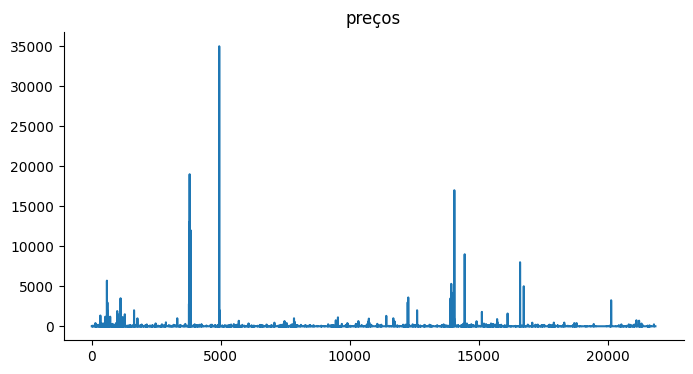

In [17]:
# @title preços

from matplotlib import pyplot as plt

df_wanted["preços"].plot(kind="line", figsize=(8, 4), title="preços")
plt.gca().spines[["top", "right"]].set_visible(False)

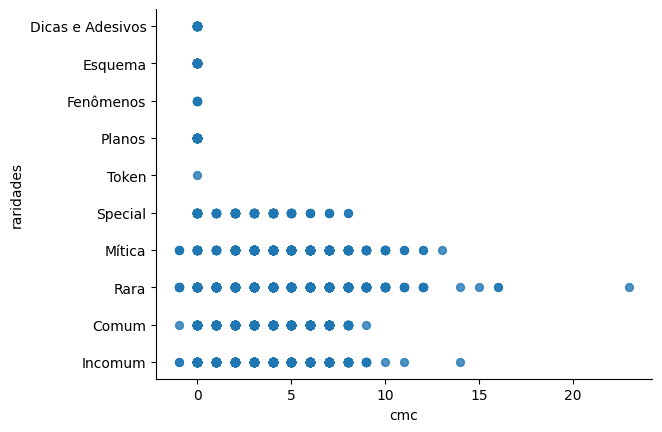

In [18]:
# @title cmc vs raridades

from matplotlib import pyplot as plt

df_wanted.plot(kind="scatter", x="cmc", y="raridades", s=32, alpha=0.8)
plt.gca().spines[
    [
        "top",
        "right",
    ]
].set_visible(False)

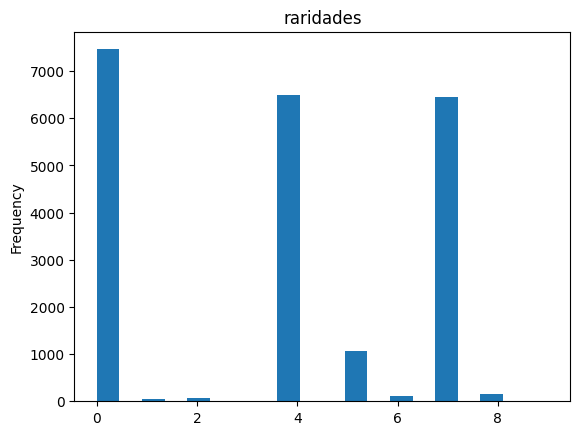

In [19]:
# @title raridades

from matplotlib import pyplot as plt

df_wanted["rarity_categorized"].plot(kind="hist", bins=20, title="raridades")
plt.gca().spines[
    [
        "top",
        "right",
    ]
].set_visible(True)

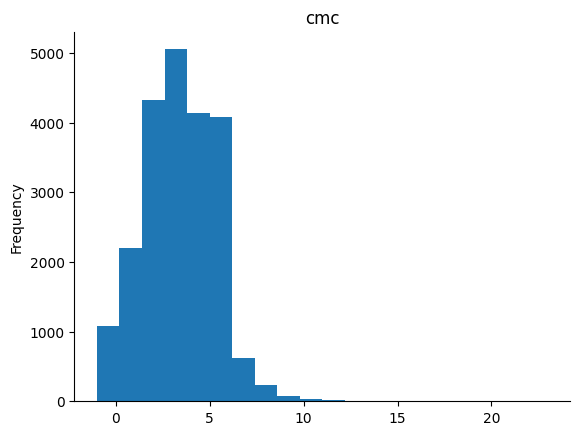

In [20]:
# @title cmc

from matplotlib import pyplot as plt

df_wanted["cmc"].plot(kind="hist", bins=20, title="cmc")
plt.gca().spines[
    [
        "top",
        "right",
    ]
].set_visible(False)

# Filtrando por Tipo

In [21]:
df_name = df_wanted["name"]
df_wanted.drop(columns=["name"], inplace=True)
df_wanted.set_index(df_name, inplace=True)

In [22]:
norarity = ["Planos", "Token", "Esquemas", "Dicas e Adesivos", "Fenômenos"]
for K in norarity:
    df_wanted.drop(df_wanted.loc[df_wanted["raridades"] == f"{K}"].index, inplace=True)

In [23]:
df_wanted2 = df_wanted.drop(columns="lealdade")
notributes = ["power", "resistence"]
df_wanted3 = df_wanted2.drop(columns=[col for col in df_wanted2 if col in notributes])
df_wanted4 = df_wanted3.drop(columns="cmc")
df_wanted5 = df_wanted.drop(columns=[col for col in df_wanted2 if col in notributes])

In [24]:
df_art = df_wanted2.loc[df_wanted["tipo"].str.contains("Artifact")]
df_mag = df_wanted3.loc[df_wanted["tipo"].str.contains("Sorcery")]
df_inst = df_wanted3.loc[df_wanted["tipo"].str.contains("Instant")]
df_enc = df_wanted3.loc[df_wanted["tipo"].str.contains("Enchantment")]
df_terr = df_wanted4.loc[df_wanted["tipo"].str.contains("Land")]
df_crea = df_wanted2.loc[df_wanted["tipo"].str.contains("Creature")]
df_planes = df_wanted5.loc[df_wanted["tipo"].str.contains("Planeswalker")]

In [25]:
df_art

,tipo,cmc,power,resistence,texto,raridades,preços,rarity_categorized
name,,,,,,,,
Angel's Feather,Artifact,2,-1,-1,"Whenever a player casts a white spell, you may...",Incomum,0.09,4
Bottle Gnomes,Artifact Creature — Gnome,3,1,3,Sacrifice Bottle Gnomes: You gain 3 life.,Incomum,0.20,4
Chimeric Staff,Artifact,4,-1,-1,{X}: Chimeric Staff becomes an X/X Construct a...,Rara,0.36,7
Chromatic Star,Artifact,1,-1,-1,"{1}, {T}, Sacrifice Chromatic Star: Add one ma...",Incomum,0.00,4
Citanul Flute,Artifact,5,-1,-1,"{X}, {T}: Search your library for a creature c...",Rara,6.20,7
...,...,...,...,...,...,...,...,...
Sentinel Totem,Artifact,1,-1,-1,"When Sentinel Totem enters the battlefield, sc...",Incomum,0.08,4
Sleek Schooner,Artifact — Vehicle,3,4,3,Crew 1 (Tap any number of creatures you contro...,Incomum,0.05,4
Eternity Vessel,Artifact,6,-1,-1,Eternity Vessel enters the battlefield with X ...,Mítica,9.75,5


In [26]:
df_crea["tipo"].values

array(['Creature — Human Cleric', 'Creature — Angel', 'Creature — Wall',
       ..., 'Creature — Elemental', 'Artifact Creature — Construct',
       'Creature — Sphinx Rogue'], dtype=object)

In [27]:
to_drop2 = [
    "*",
    "1+*",
    "2+*",
    "-1",
    "+1",
    "+3",
    "3.5",
    "?",
    "∞",
    "2.5",
    "1.5",
    "99",
    ".5",
    "*²",
    "+4",
    "+0",
    "+2",
    -1,
]
for k in range(len(to_drop2)):
    df_crea = df_crea[df_crea.power != to_drop2[k]]

In [28]:
to_drop2 = ["*", "1+*", "+1", "3.5", "?", "1.5", "0", -1]
for k in range(len(to_drop2)):
    df_crea = df_crea[df_crea.resistence != to_drop2[k]]

In [29]:
df_crea["power"] = df_crea["power"].astype(float)
df_crea["resistence"] = df_crea["resistence"].astype(float)

# Criaturas

In [30]:
df_crea

,tipo,cmc,power,resistence,texto,raridades,preços,rarity_categorized
name,,,,,,,,
Ancestor's Chosen,Creature — Human Cleric,7,4.0,4.0,First strike (This creature deals combat damag...,Incomum,0.08,4
Angel of Mercy,Creature — Angel,5,3.0,3.0,FlyingWhen Angel of Mercy enters the battlefie...,Comum,0.10,0
Angelic Wall,Creature — Wall,2,0.0,4.0,Defender (This creature can’t attack.)Flying,Comum,0.04,0
Aven Cloudchaser,Creature — Bird Soldier,4,2.0,2.0,Flying (This creature can’t be blocked except ...,Comum,0.05,0
Ballista Squad,Creature — Human Rebel,4,2.0,2.0,"{X}{W}, {T}: Ballista Squad deals X damage to ...",Incomum,0.10,4
...,...,...,...,...,...,...,...,...
Timbermaw Larva,Creature — Beast,4,2.0,2.0,"Whenever Timbermaw Larva attacks, it gets +1/+...",Comum,0.05,0
Turntimber Ranger,Creature — Elf Scout Ranger Ally,5,2.0,2.0,Whenever Turntimber Ranger or another Ally ent...,Rara,0.87,7
Zendikar Farguide,Creature — Elemental,5,3.0,3.0,Forestwalk (This creature can’t be blocked as ...,Comum,0.04,0


In [31]:
df_crea.describe().T # T transposes the table

,count,mean,std,min,25%,50%,75%,max
cmc,11587.0,3.673082,1.697055,0.0,2.00,3.00,5.00,16.00
power,11587.0,2.659964,1.667674,0.0,2.00,2.00,3.00,18.00
resistence,11587.0,2.848019,1.651686,1.0,2.00,3.00,4.00,16.00
preços,11587.0,13.372335,197.314093,0.0,0.05,0.12,0.99,12999.99
rarity_categorized,11587.0,3.381807,2.870484,0.0,0.00,4.00,7.00,8.00


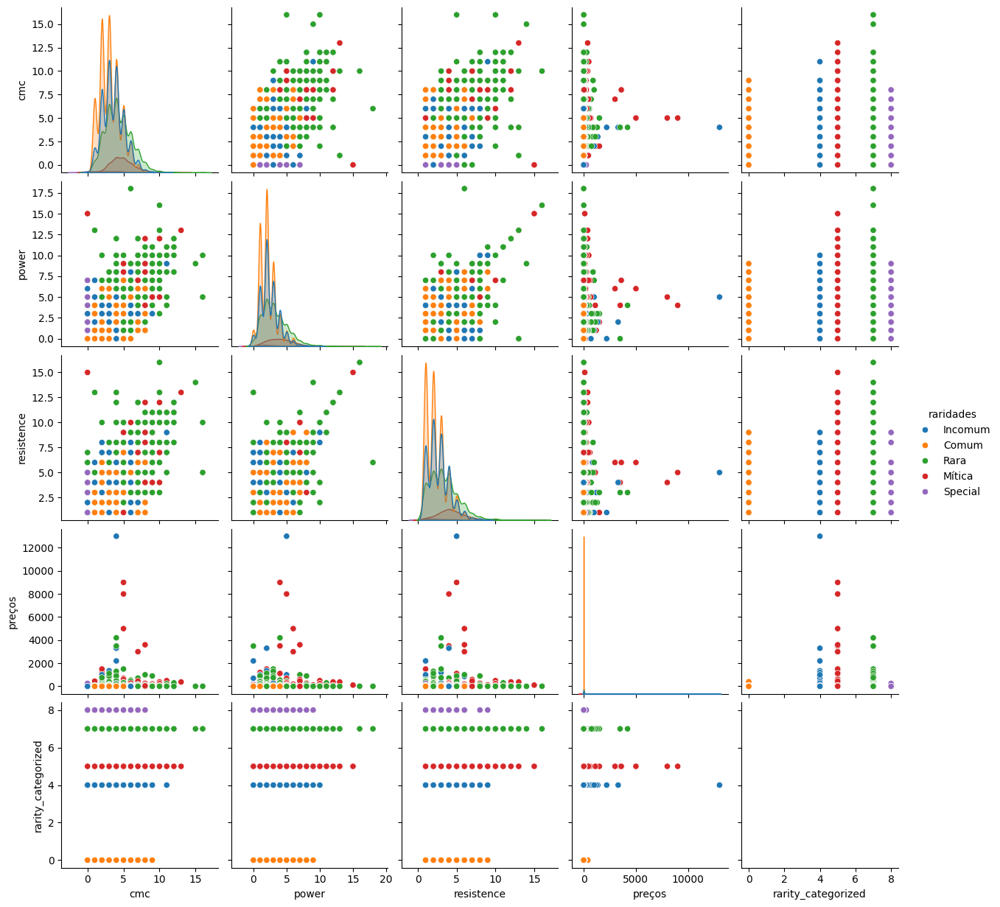

In [32]:
import seaborn as sns

sns.pairplot(df_crea, hue="raridades")

Clusterizando os textos 

In [33]:
from sentence_transformers import SentenceTransformer, util

In [34]:
df_crea["texto"].replace(r"\s+|\\n", " ", regex=True, inplace=True)

C:\Users\drodm\AppData\Local\Temp\ipykernel_22244\1970886856.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [35]:
to_drop2 = [-1]
for k in range(len(to_drop2)):
    df_crea = df_crea[df_crea.texto != to_drop2[k]]

In [36]:
sentences = df_crea.texto.to_list()
embedder = SentenceTransformer("sentence-transformers/all-mpnet-base-v2")
corpus_embeddings = embedder.encode(sentences)
# Normalize the embeddings to unit length
corpus_embeddings = corpus_embeddings / np.linalg.norm(
    corpus_embeddings, axis=1, keepdims=True
)
clustering_model = KMeans(n_clusters=539)
clustering_model.fit(corpus_embeddings)
cluster_assignment = clustering_model.labels_
df_crea["cluster_textclass"] = cluster_assignment

Clusterização Geral (Texto + Atributos)


In [ ]:
noatributes = ["tipo", "texto", "preços", "raridades"]
feature = df_crea.drop(columns=[col for col in df_crea if col in noatributes])
target = df_crea["preços"]

1334
0.37421666481967797


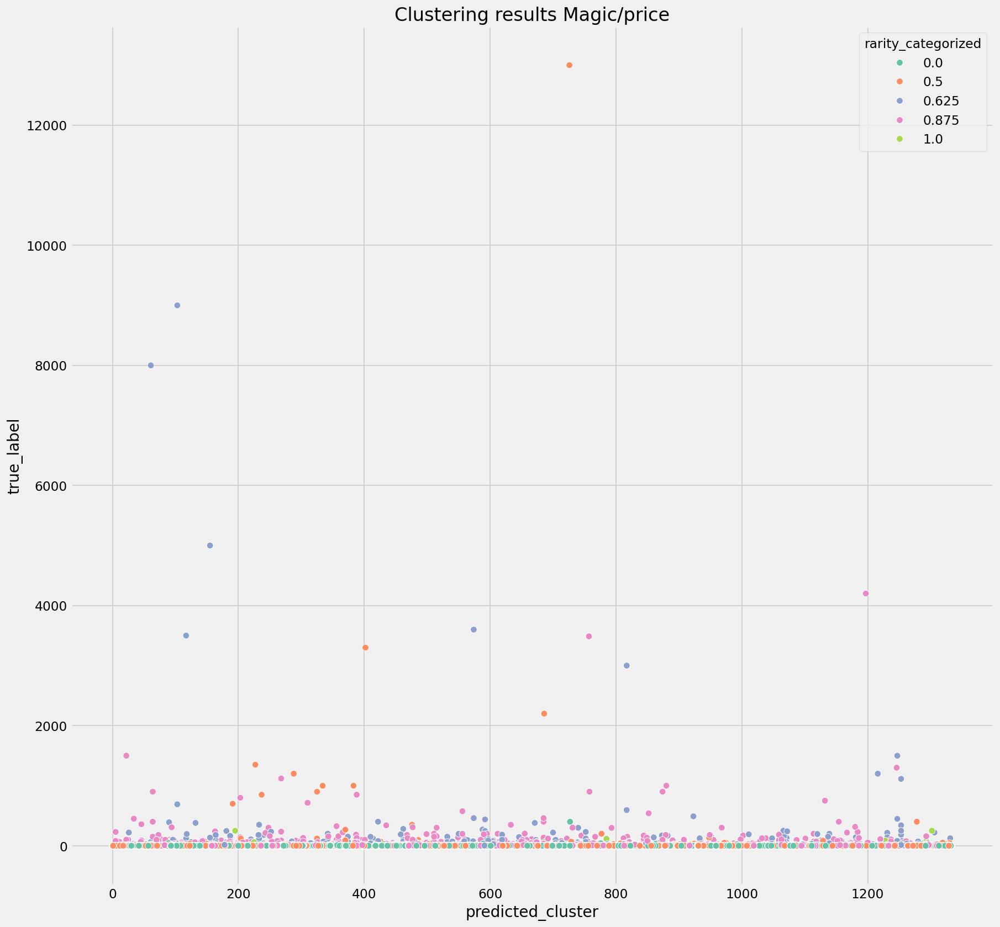

In [ ]:
X_train_val, X_test, y_train_val, y_test = train_test_split(
    feature, target, test_size=None, random_state=None
)  # hold out 10% of the data for final testing
label_encoder = LabelEncoder()

true_labels = label_encoder.fit_transform(target)
label_encoder.classes_

n_clusters = len(label_encoder.classes_)

print(n_clusters)
preprocessor = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        # ("pca", PCA(n_components=5, random_state=42)),

    ]
)
clusterer = Pipeline(
    [
        (
            "kmeans",
            KMeans(
                n_clusters=n_clusters,
                init="k-means++",
                n_init=100,
                max_iter=10000,
                random_state=42,
            )
        ),
    ]
)
pipe = Pipeline([("preprocessor", preprocessor), ("clusterer", clusterer)])
pipe.fit(feature)
preprocessed_data = pipe["preprocessor"].transform(feature)

predicted_labels = pipe["clusterer"]["kmeans"].labels_


print(silhouette_score(preprocessed_data, predicted_labels))
adjusted_rand_score(true_labels, predicted_labels)
plt.rcParams["figure.dpi"] = 120
dfcluster = pd.DataFrame(
    pipe["preprocessor"].transform(feature),
    columns=feature.columns,
)

dfcluster["predicted_cluster"] = pipe["clusterer"]["kmeans"].labels_
dfcluster["true_label"] = label_encoder.inverse_transform(true_labels)

plt.style.use("fivethirtyeight")
plt.figure(figsize=(16, 16))

scat = sns.scatterplot(
    data=dfcluster[
        ["predicted_cluster", "true_label",'cluster_textclass',"rarity_categorized"]
    ],
    x="predicted_cluster",
    y="true_label",
    s=50,
    hue="rarity_categorized",
    # style="true_label",
    palette="Set2",
)

scat.set_title("Clustering results Magic/price")

plt.show()

In [ ]:
from umap import UMAP
import plotly.express as px

features = dfcluster

umap_2d = UMAP(n_components=2, init="random", random_state=42)
umap_3d = UMAP(n_components=3, init="random", random_state=42)

proj_2d = umap_2d.fit_transform(features)
proj_3d = umap_3d.fit_transform(features)

fig_2d = px.scatter(
    proj_2d,
    x=dfcluster["cluster_textclass"],
    y=dfcluster["predicted_cluster"],
    color=dfcluster["predicted_cluster"],
    labels={"color": "predicted_cluster"},
)
fig_3d = px.scatter_3d(
    proj_3d,
    y=dfcluster["cluster_textclass"],
    x=dfcluster["predicted_cluster"],
    z=dfcluster["true_label"],
    color=dfcluster["predicted_cluster"],
    labels={"color": "predicted_cluster"},
)
fig_3d.update_traces(marker_size=2)

fig_2d.show()
fig_3d.show()

c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.

c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



Previsão do preço

In [ ]:
X_test

,cmc,power,resistence,rarity_categorized,cluster_textclass
name,,,,,
Pelargir Survivor,2,1.0,3.0,0,77
Hero of Iroas,2,2.0,2.0,4,238
Rafter Demon,4,4.0,2.0,0,268
Havoc Jester,5,5.0,5.0,4,20
Siren of the Fanged Coast,5,1.0,1.0,4,224
...,...,...,...,...,...
Spellwild Ouphe,2,1.0,3.0,4,251
Dream Fighter,3,1.0,1.0,0,328
Hollowhead Sliver,3,2.0,2.0,4,521


Usando carta do conjunto de teste

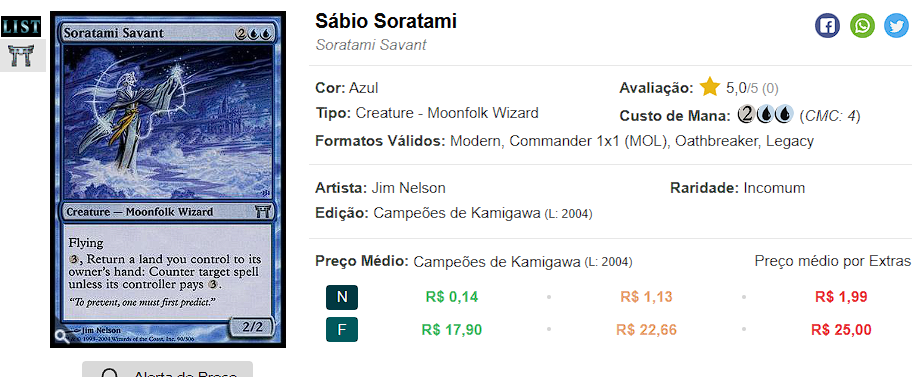

In [ ]:
test_text = "Flying {3}, Return a land you control to its owner’s hand: Counter target spell unless its controller pays {3}."
textclass = clustering_model.predict(embedder.encode(test_text).reshape(1, -1))
# alterar valores conforme atributos da carta a ser testada e o valor de saída de classificação do texto
valores = [[4, 2, 2, 4, textclass]]

test_input = pd.DataFrame(
    valores,
    columns=["cmc", "power", "resistence", "rarity_categorized", "cluster_textclass"],
)

# Analisando a distribuição estatistica dos valores

In [ ]:
from scipy import stats
value_list = dfcluster["true_label"].loc[
    dfcluster["predicted_cluster"] == int(pipe.predict(test_input))
]
stats.bayes_mvs(value_list, 0.908)

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\3515366784.py:3: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



(Mean(statistic=0.12947368421052632, minmax=(0.08459100135859463, 0.174356367062458)),
 Variance(statistic=0.01359342105263158, minmax=(0.0074486923273452115, 0.02354632866301036)),
 Std_dev(statistic=0.11478441647399854, minmax=(0.08630580703142293, 0.15344813020369574)))

É Possivel averiguar que o algoritmo consegue agrupar cartas que estatisticamente daram o preço aproximado de qualquer carta que se assemelhe com as do devido cluster.

In [ ]:
X = dfcluster.loc[
    dfcluster["predicted_cluster"] == int(pipe.predict(test_input))
]

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\1730084976.py:2: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



In [ ]:
feature = X.drop(columns=['predicted_cluster','true_label','cmc','power','resistence','rarity_categorized'])
target = X['true_label']
to_predict = feature['cluster_textclass'].mean()

In [ ]:
to_predict

0.19575425552729406

In [ ]:
X_train_val, X_test, y_train_val, y_test = train_test_split(
    feature, target, test_size=0.2, random_state=None
)  # hold out 20% of the data for final testing

In [ ]:
X_test

,cluster_textclass
9319,0.182156
7817,0.204461
4895,0.221190
1861,0.172862


In [ ]:
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [ ]:
lm = LinearRegression()

lm.fit(feature,target)

for column, coeff in zip(feature.columns,lm.coef_):
    print('feature: ', column, ',', 'coeff: ', coeff)

feature:  cluster_textclass , coeff:  -0.573340388892875


In [ ]:
model = sm.OLS(target.astype(float),feature.astype(float)) # Same as sklearn linear regression

#Fit
fit = model.fit()

#Print out summary
fit.summary()

c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_stats_py.py:1971: UserWarning:

kurtosistest only valid for n>=20 ... continuing anyway, n=19



<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:             true_label   R-squared (uncentered):                   0.572
Model:                            OLS   Adj. R-squared (uncentered):              0.548
Method:                 Least Squares   F-statistic:                              24.06
Date:                Sun, 05 May 2024   Prob (F-statistic):                    0.000114
Time:                        18:05:31   Log-Likelihood:                          14.999
No. Observations:                  19   AIC:                                     -28.00
Df Residuals:                      18   BIC:                                     -27.05
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
cluster_textclass     0.6445      0.131      4.905      0.000       0.368       0.921
==============================================================================
Omnibus:                       20.359   Durbin-Watson:                   2.133
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               24.468
Skew:                           1.895   Prob(JB):                     4.86e-06
Kurtosis:                       7.067   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
X_train_val, y_train_val = np.array(X_train_val), np.array(y_train_val)
X_train_val.shape

(15, 1)

In [ ]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    kf = KFold(n_splits=2, shuffle=True, random_state = None)

    # simple LR stats
    lm_train_r2s = [] 
    lm_val_r2s = []
    lm_train_RMSEs = []
    lm_val_RMSEs = []

    # polynomial LR stats 
    poly_train_r2s = [] 
    poly_val_r2s = []
    poly_train_RMSEs = []
    poly_val_RMSEs = []

    # ridgeCV scaled LR stats 
    rid_scale_train_r2s = []
    rid_scale_val_r2s = []
    rid_scale_train_RMSEs = []
    rid_scale_val_RMSEs = []

    # ridgeCV scaled polynomial LR stats
    rid_scale_poly_train_r2s = []
    rid_scale_poly_val_r2s = []
    rid_scale_poly_train_RMSEs = []
    rid_scale_poly_val_RMSEs = []

    # lassoCV scaled LR stats
    las_scale_train_r2s = []
    las_scale_val_r2s = []
    las_scale_train_RMSEs = []
    las_scale_val_RMSEs = []

    # lassoCV scaled polynomial LR stats
    las_scale_poly_train_r2s = []
    las_scale_poly_val_r2s = []
    las_scale_poly_train_RMSEs = []
    las_scale_poly_val_RMSEs = []


    #################################################################################################################    
    #################################################################################################################
    #################################################################################################################

    ## LOOP

    for train_ind, val_ind in kf.split(X_train_val,y_train_val):
        
        X_train, y_train = X_train_val[train_ind], y_train_val[train_ind]
        X_val, y_val = X_train_val[val_ind], y_train_val[val_ind] 
        
        # Scaling
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train) # fit_transform on train
        X_val_scaled = scaler.transform(X_val) # ONLY transform on val
        
        # Poly transforming
        poly = PolynomialFeatures(degree=2) 
        X_train_poly = poly.fit_transform(X_train)
        X_val_poly = poly.transform(X_val)
        
        # Scaling then poly transforming
        X_train_scaled_poly = poly.fit_transform(X_train_scaled)
        X_val_scaled_poly = poly.transform(X_val_scaled)


    #######################################################   
        
        ### Model 1: Simple LR
        lm = LinearRegression()
        lm.fit(X_train, y_train)
        
        lm_train_r2s.append(lm.score(X_train, y_train))
        lm_val_r2s.append(lm.score(X_val, y_val))
        lm_train_RMSEs.append(mean_squared_error(y_train, lm.predict(X_train),  squared=False))
        lm_val_RMSEs.append(mean_squared_error(y_val, lm.predict(X_val),  squared=False))

    #######################################################
        
        ### Model 2: polynomial LR 
        lm_poly = LinearRegression()
        lm_poly.fit(X_train_poly, y_train)
        
        poly_train_r2s.append(lm_poly.score(X_train_poly, y_train))
        poly_val_r2s.append(lm_poly.score(X_val_poly, y_val))
        poly_train_RMSEs.append(mean_squared_error(y_train, lm.predict(X_train),  squared=False))
        poly_val_RMSEs.append(mean_squared_error(y_val, lm.predict(X_val),  squared=False))

    #######################################################
        
        ### Model 3: RidgeCV with feature scaling
        rid_scale = RidgeCV()
        rid_scale.fit(X_train_scaled, y_train)
        
        rid_scale_train_r2s.append(rid_scale.score(X_train_scaled, y_train))
        rid_scale_val_r2s.append(rid_scale.score(X_val_scaled, y_val))
        rid_scale_train_RMSEs.append(mean_squared_error(y_train, rid_scale.predict(X_train_scaled),  squared=False))
        rid_scale_val_RMSEs.append(mean_squared_error(y_val, rid_scale.predict(X_val_scaled),  squared=False))

    #######################################################

        ### Model 4: RidgeCV with feature scaling and polynomial transformation
        
        rid_scale_poly = RidgeCV() 
        rid_scale_poly.fit(X_train_scaled_poly, y_train)

        rid_scale_poly_train_r2s.append(rid_scale_poly.score(X_train_scaled_poly, y_train))
        rid_scale_poly_val_r2s.append(rid_scale_poly.score(X_val_scaled_poly, y_val))
        rid_scale_poly_train_RMSEs.append(mean_squared_error(y_train, rid_scale_poly.predict(X_train_scaled_poly),  squared=False))
        rid_scale_poly_val_RMSEs.append(mean_squared_error(y_val, rid_scale_poly.predict(X_val_scaled_poly),  squared=False))

    #######################################################
        
        ### Model 5: LassoCV with feature scaling
        las_scale = LassoCV()
        las_scale.fit(X_train_scaled, y_train)
        
        las_scale_train_r2s.append(las_scale.score(X_train_scaled, y_train))
        las_scale_val_r2s.append(las_scale.score(X_val_scaled, y_val))
        las_scale_train_RMSEs.append(mean_squared_error(y_train, las_scale.predict(X_train_scaled),  squared=False))
        las_scale_val_RMSEs.append(mean_squared_error(y_val, las_scale.predict(X_val_scaled),  squared=False))

    #######################################################

        ### Model 6: LassoCV with feature scaling and polynomial transformation
        
        las_scale_poly = LassoCV() 
        las_scale_poly.fit(X_train_scaled_poly, y_train)

        las_scale_poly_train_r2s.append(las_scale_poly.score(X_train_scaled_poly, y_train))
        las_scale_poly_val_r2s.append(las_scale_poly.score(X_val_scaled_poly, y_val))
        las_scale_poly_train_RMSEs.append(mean_squared_error(y_train, las_scale_poly.predict(X_train_scaled_poly),  squared=False))
        las_scale_poly_val_RMSEs.append(mean_squared_error(y_val, las_scale_poly.predict(X_val_scaled_poly),  squared=False))

    #######################################################


    #################################################################################################################
    #################################################################################################################
    #################################################################################################################

    # 1. Simple LR output
    print('Simple LR')
    print('Train r2s: ', lm_train_r2s)
    print('Val r2s: ', lm_val_r2s)

    print(f'Train mean r^2: {np.mean(lm_train_r2s):.3f} +- {np.std(lm_train_r2s):.3f}')
    print(f'Val mean r^2: {np.mean(lm_val_r2s):.3f} +- {np.std(lm_val_r2s):.3f}')

    print(f'Train mean RMSE: {np.mean(lm_train_RMSEs):.3f} +- {np.std(lm_train_RMSEs):.3f}')
    print(f'val mean RMSE: {np.mean(lm_val_RMSEs):.3f} +- {np.std(lm_val_RMSEs):.3f}')

    print('\n')
    #################################################################################################################
    # 2. Simple LR with polynomial transformation output
    print('Simple LR with polynomial transformation')

    print(f'Train mean r^2: {np.mean(poly_train_r2s):.3f} +- {np.std(poly_train_r2s):.3f}')
    print(f'Val mean r^2: {np.mean(poly_val_r2s):.3f} +- {np.std(poly_val_r2s):.3f}')

    print(f'Train mean RMSE: {np.mean(poly_train_RMSEs):.3f} +- {np.std(poly_train_RMSEs):.3f}')
    print(f'val mean RMSE: {np.mean(poly_val_RMSEs):.3f} +- {np.std(poly_val_RMSEs):.3f}')

    print('\n')
    #################################################################################################################
    # 3. RidgeCV with scaling transformation output
    print('RidgeCV with scaling transformation')

    print(f'Train mean r^2: {np.mean(rid_scale_train_r2s):.3f} +- {np.std(rid_scale_train_r2s):.3f}')
    print(f'Val mean r^2: {np.mean(rid_scale_val_r2s):.3f} +- {np.std(rid_scale_val_r2s):.3f}')

    print(f'Train mean RMSE: {np.mean(rid_scale_train_RMSEs):.3f} +- {np.std(rid_scale_train_RMSEs):.3f}')
    print(f'val mean RMSE: {np.mean(rid_scale_val_RMSEs):.3f} +- {np.std(rid_scale_val_RMSEs):.3f}')

    print('\n')
    #################################################################################################################
    # 4. RidgeCV with scaling and polynomial transformation output
    print('RidgeCV with scaling and polynomial transformation')

    print(f'Train mean r^2: {np.mean(rid_scale_poly_train_r2s):.3f} +- {np.std(rid_scale_poly_train_r2s):.3f}')
    print(f'Val mean r^2: {np.mean(rid_scale_poly_val_r2s):.3f} +- {np.std(rid_scale_poly_val_r2s):.3f}')

    print(f'Train mean RMSE: {np.mean(rid_scale_poly_train_RMSEs):.3f} +- {np.std(rid_scale_poly_train_RMSEs):.3f}')
    print(f'val mean RMSE: {np.mean(rid_scale_poly_val_RMSEs):.3f} +- {np.std(rid_scale_poly_val_RMSEs):.3f}')

    print('\n')
    #################################################################################################################
    # 5. LassoCV with scaling transformation output
    print('LassoCV with scaling transformation')

    print(f'Train mean r^2: {np.mean(las_scale_train_r2s):.3f} +- {np.std(las_scale_train_r2s):.3f}')
    print(f'Val mean r^2: {np.mean(las_scale_val_r2s):.3f} +- {np.std(las_scale_val_r2s):.3f}')

    print(f'Train mean RMSE: {np.mean(las_scale_train_RMSEs):.3f} +- {np.std(las_scale_train_RMSEs):.3f}')
    print(f'val mean RMSE: {np.mean(las_scale_val_RMSEs):.3f} +- {np.std(las_scale_val_RMSEs):.3f}')

    print('\n')
    #################################################################################################################
    # 6. LassoCV with scaling and polynomial transformation output
    print('LassoCV with scaling and polynomial transformation')

    print(f'Train mean r^2: {np.mean(las_scale_poly_train_r2s):.3f} +- {np.std(las_scale_poly_train_r2s):.3f}')
    print(f'Val mean r^2: {np.mean(las_scale_poly_val_r2s):.3f} +- {np.std(las_scale_poly_val_r2s):.3f}')

    print(f'Train mean RMSE: {np.mean(las_scale_poly_train_RMSEs):.3f} +- {np.std(las_scale_poly_train_RMSEs):.3f}')
    print(f'val mean RMSE: {np.mean(las_scale_poly_val_RMSEs):.3f} +- {np.std(las_scale_poly_val_RMSEs):.3f}')


Simple LR
Train r2s:  [0.22388290484639106, 0.19046009691142374]
Val r2s:  [-0.2825256098593296, -2.8693842919039647]
Train mean r^2: 0.207 +- 0.017
Val mean r^2: -1.576 +- 1.293
Train mean RMSE: 0.094 +- 0.038
val mean RMSE: 0.146 +- 0.021


Simple LR with polynomial transformation
Train mean r^2: 0.502 +- 0.302
Val mean r^2: -1.882 +- 1.463
Train mean RMSE: 0.094 +- 0.038
val mean RMSE: 0.146 +- 0.021


RidgeCV with scaling transformation
Train mean r^2: 0.139 +- 0.007
Val mean r^2: -0.718 +- 0.559
Train mean RMSE: 0.098 +- 0.039
val mean RMSE: 0.127 +- 0.031


RidgeCV with scaling and polynomial transformation
Train mean r^2: 0.328 +- 0.197
Val mean r^2: -0.724 +- 0.528
Train mean RMSE: 0.091 +- 0.047
val mean RMSE: 0.128 +- 0.033


LassoCV with scaling transformation
Train mean r^2: 0.048 +- 0.048
Val mean r^2: -0.526 +- 0.436
Train mean RMSE: 0.102 +- 0.038
val mean RMSE: 0.122 +- 0.032


LassoCV with scaling and polynomial transformation
Train mean r^2: 0.420 +- 0.338
Val mean r^

In [ ]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    # Scaling
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train_val) # fit_transform on original 80% of data
    X_test_scaled = scaler.transform(X_test) # ONLY transform on val

    # Polynomial transform
    poly = PolynomialFeatures(degree=2) 
    X_train_scaled_poly = poly.fit_transform(X_train_scaled)
    X_test_scaled_poly = poly.transform(X_test_scaled)

    las_scale_poly_TEST = LassoCV()
    las_scale_poly_TEST.fit(X_train_scaled_poly, y_train_val) # fitting model with transformed original train set

    print(f'Lasso Scaled Polynomial Regression R^2 - Train set: {las_scale_poly_TEST.score(X_train_scaled_poly, y_train_val):.3f}') 

    print(f'Lasso Scaled Polynomial Regression R^2 - Test set: {las_scale_poly_TEST.score(X_test_scaled_poly, y_test):.3f}') 

    print(f'RMSE on test set: {mean_squared_error(y_test, las_scale_poly_TEST.predict(X_test_scaled_poly),  squared=False):.3f}') 


Lasso Scaled Polynomial Regression R^2 - Train set: 0.000
Lasso Scaled Polynomial Regression R^2 - Test set: -12.998
RMSE on test set: 0.049


In [ ]:
test_set_pred = las_scale_poly_TEST.predict(X_test_scaled_poly)

Text(0, 0.5, 'actual')

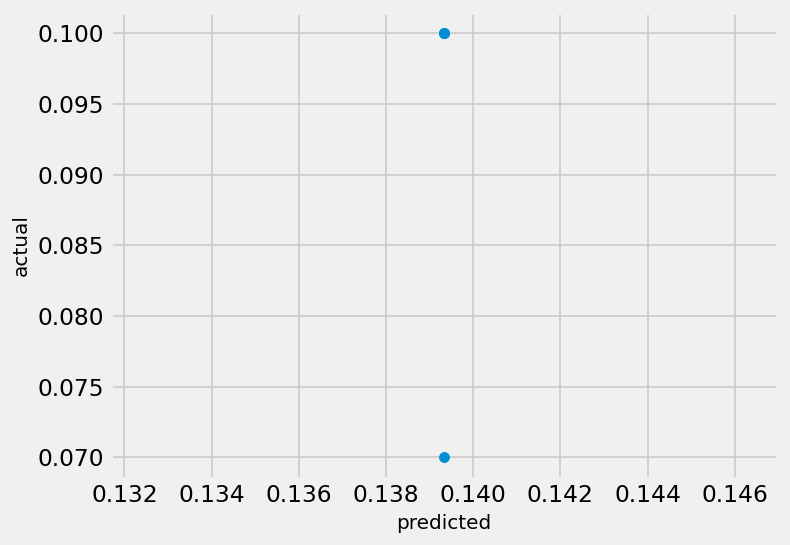

In [ ]:
plt.scatter(test_set_pred, y_test)
plt.xlabel('predicted', size = 12)
plt.ylabel('actual', size = 12)

In [ ]:
X_test

,cluster_textclass
9319,0.182156
7817,0.204461
4895,0.221190
1861,0.172862


In [ ]:
test_set_pred

array([0.13933333, 0.13933333, 0.13933333, 0.13933333])

In [ ]:
pred = lm.predict(X_test)
#pred
resid = pred-y_test.astype(float)
resid

c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:486: UserWarning:

X has feature names, but LinearRegression was fitted without feature names



9319    0.134413
7817    0.044362
4895   -0.000676
1861    0.129434
Name: true_label, dtype: float64

In [ ]:
resid = test_set_pred-y_test.astype(float)
resid

9319    0.069333
7817    0.039333
4895    0.039333
1861    0.039333
Name: true_label, dtype: float64

In [ ]:
y_test

9319    0.07
7817    0.10
4895    0.10
1861    0.10
Name: true_label, dtype: float64

# Prevendo apenas 1 valor

In [ ]:
predicted = lm.predict(to_predict.reshape(-1, 1))
predicted[0]

0.1678026725460694

In [ ]:
predict_scaled = scaler.transform(to_predict.reshape(-1, 1)) # ONLY transform on val
X_test_scaled_poly = poly.transform(predict_scaled)
predicted2 = las_scale_poly_TEST.predict(X_test_scaled_poly)
predicted2[0]

0.13933333333333336

# Artefatos



In [ ]:
to_drop2 = [
    "*",
    "1+*",
    "2+*",
    "-1",
    "+1",
    "+3",
    "3.5",
    "?",
    "∞",
    "2.5",
    "1.5",
    "99",
    ".5",
    "*²",
    "+4",
    "+0",
    "+2",
]
for k in range(len(to_drop2)):
    df_art = df_art[df_art.power != to_drop2[k]]

In [ ]:
df_art

,tipo,cmc,power,resistence,texto,raridades,preços,rarity_categorized
name,,,,,,,,
Angel's Feather,Artifact,2,-1,-1,"Whenever a player casts a white spell, you may...",Incomum,0.09,4
Bottle Gnomes,Artifact Creature — Gnome,3,1,3,Sacrifice Bottle Gnomes: You gain 3 life.,Incomum,0.20,4
Chimeric Staff,Artifact,4,-1,-1,{X}: Chimeric Staff becomes an X/X Construct a...,Rara,0.36,7
Chromatic Star,Artifact,1,-1,-1,"{1}, {T}, Sacrifice Chromatic Star: Add one ma...",Incomum,0.00,4
Citanul Flute,Artifact,5,-1,-1,"{X}, {T}: Search your library for a creature c...",Rara,6.20,7
...,...,...,...,...,...,...,...,...
Sentinel Totem,Artifact,1,-1,-1,"When Sentinel Totem enters the battlefield, sc...",Incomum,0.08,4
Sleek Schooner,Artifact — Vehicle,3,4,3,Crew 1 (Tap any number of creatures you contro...,Incomum,0.05,4
Eternity Vessel,Artifact,6,-1,-1,Eternity Vessel enters the battlefield with X ...,Mítica,9.75,5


In [ ]:
df_art["power"].replace(-1, 0, inplace=True)
df_art["resistence"].replace(-1, 0, inplace=True)

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\2579689678.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\2579689678.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=

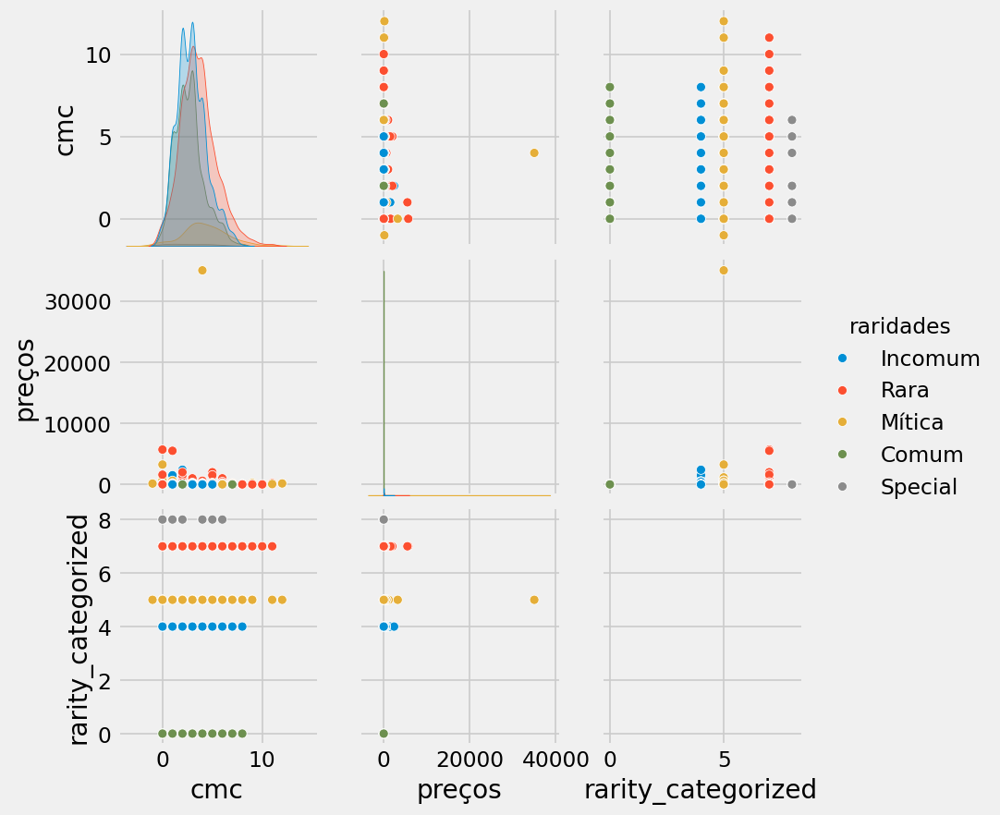

In [ ]:
import seaborn as sns

sns.pairplot(df_art, hue="raridades")

Clusterizando os textos

In [ ]:
sentences = df_art.texto.to_list()
embedder = SentenceTransformer("sentence-transformers/all-mpnet-base-v2")
corpus_embeddings = embedder.encode(sentences)
# Normalize the embeddings to unit length
corpus_embeddings = corpus_embeddings / np.linalg.norm(
    corpus_embeddings, axis=1, keepdims=True
)
clustering_model = KMeans(n_clusters=635)
clustering_model.fit(corpus_embeddings)
cluster_assignment = clustering_model.labels_
df_art["cluster_textclass"] = cluster_assignment

Clusterização Geral (textos + atributos)

In [ ]:
noatributes = [
    "tipo",
    "texto",
    "preços",
    "raridades",
]
feature = df_art.drop(columns=[col for col in df_art if col in noatributes])
target = df_art["preços"]

In [ ]:
X_train_val, X_test, y_train_val, y_test = train_test_split(
    feature, target, test_size=0.2, random_state=None
)  # hold out 20% of the data for final testing

635
0.48577297719850265


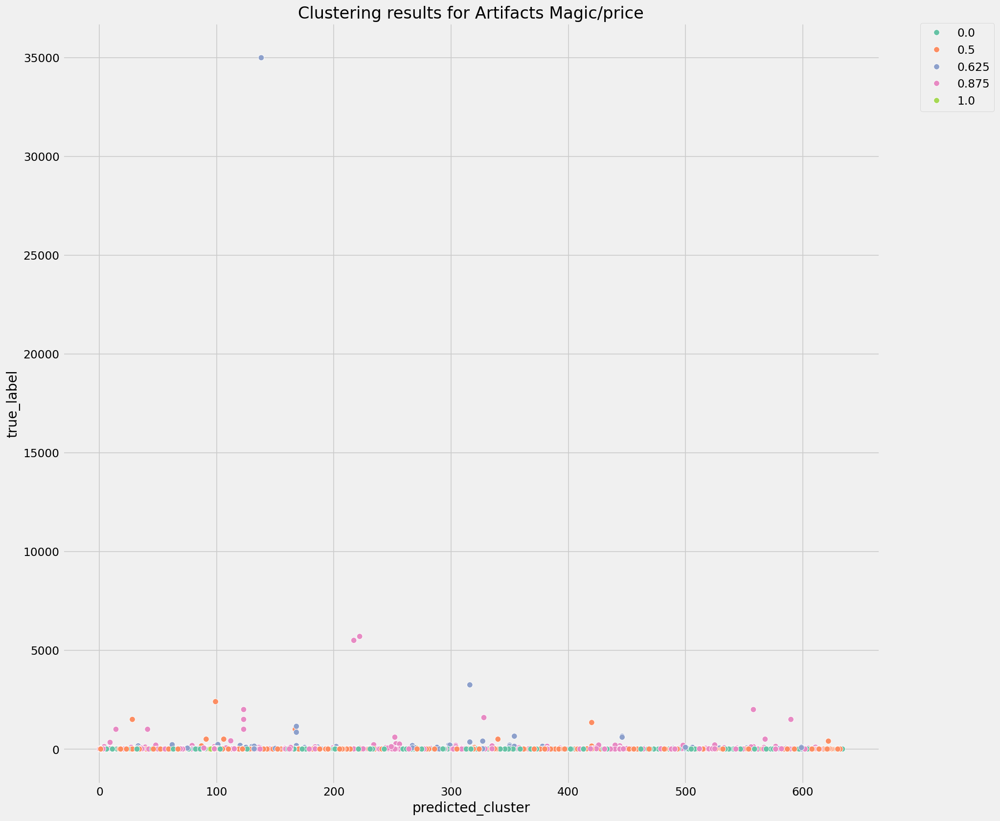

In [ ]:
label_encoder = LabelEncoder()

true_labels = label_encoder.fit_transform(target)
label_encoder.classes_

n_clusters = len(label_encoder.classes_)

print(n_clusters)
preprocessor = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        # ("pca", PCA(n_components=5, random_state=42)),
    ]
)
clusterer = Pipeline(
    [
        (
            "kmeans",
            KMeans(
                n_clusters=n_clusters,
                init="k-means++",
                n_init=50,
                max_iter=500,
                random_state=42,
            ),
        ),
    ]
)
pipe = Pipeline([("preprocessor", preprocessor), ("clusterer", clusterer)])
pipe.fit(feature)
preprocessed_data = pipe["preprocessor"].transform(feature)

predicted_labels = pipe["clusterer"]["kmeans"].labels_

print(silhouette_score(preprocessed_data, predicted_labels))
adjusted_rand_score(true_labels, predicted_labels)
plt.rcParams["figure.dpi"] = 120
dfcluster = pd.DataFrame(
    pipe["preprocessor"].transform(feature),
    columns=feature.columns,
)

dfcluster["predicted_cluster"] = pipe["clusterer"]["kmeans"].labels_
dfcluster["true_label"] = label_encoder.inverse_transform(true_labels)

plt.style.use("fivethirtyeight")
plt.figure(figsize=(16, 16))

scat = sns.scatterplot(
    data=dfcluster[
        ["predicted_cluster", "cluster_textclass", "true_label", "rarity_categorized"]
    ],
    x="predicted_cluster",
    y="true_label",
    s=50,
    hue="rarity_categorized",
    # style="true_label",
    palette="Set2",
)

scat.set_title("Clustering results for Artifacts Magic/price")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)

plt.show()

In [ ]:
from umap import UMAP
import plotly.express as px

features = dfcluster

umap_2d = UMAP(n_components=2, init="random", random_state=42)
umap_3d = UMAP(n_components=3, init="random", random_state=42)

proj_2d = umap_2d.fit_transform(features)
proj_3d = umap_3d.fit_transform(features)

fig_2d = px.scatter(
    proj_2d,
    x=dfcluster["cluster_textclass"],
    y=dfcluster["predicted_cluster"],
    color=dfcluster["predicted_cluster"],
    labels={"color": "predicted_cluster"},
)
fig_3d = px.scatter_3d(
    proj_3d,
    y=dfcluster["cluster_textclass"],
    x=dfcluster["predicted_cluster"],
    z=dfcluster["true_label"],
    color=dfcluster["predicted_cluster"],
    labels={"color": "predicted_cluster"},
)
fig_3d.update_traces(marker_size=2)

fig_2d.show()
fig_3d.show()

c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.

c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



Previsão do preço

In [ ]:
X_test

,cmc,power,resistence,rarity_categorized,cluster_textclass
name,,,,,
Sanctuary Blade,2,0,0,7,632
Chronomaton,1,1,1,4,334
Gust-Skimmer,2,2,1,0,413
Thran Weaponry,4,0,0,7,268
Kraken's Eye,2,0,0,4,344
...,...,...,...,...,...
Lux Artillery,4,0,0,7,117
Soldevi Digger,2,0,0,7,231
Pestilent Souleater,5,3,3,0,128


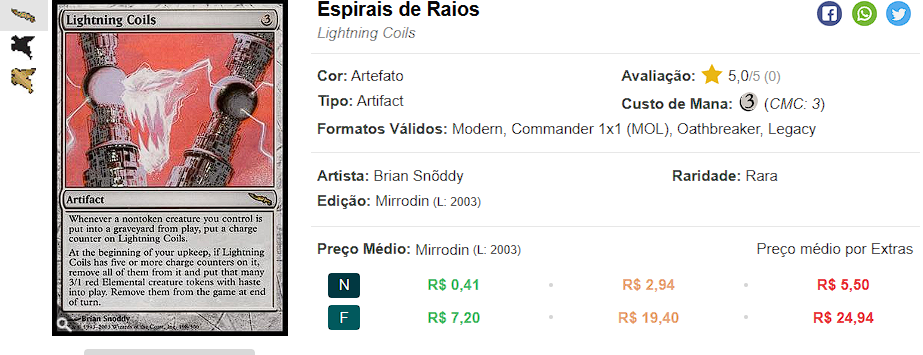

In [ ]:
test_text = "Whenever a nontoken creature you control dies, put a charge counter on Lightning Coils. At the beginning of your upkeep, if Lightning Coils has five or more charge counters on it, remove all of them from it and create that many 3/1 red Elemental creature tokens with haste. Exile them at the beginning of the next end step."
textclass = clustering_model.predict(embedder.encode(test_text).reshape(1, -1))
# alterar valores conforme atributos da carta a ser testada e o valor de saída de classificação do texto
valores = [[3, 0, 0, 7, textclass]]

test_input = pd.DataFrame(
    valores,
    columns=["cmc", "power", "resistence", "rarity_categorized", "cluster_textclass"],
)
dfcluster["true_label"].loc[
    dfcluster["predicted_cluster"] == int(pipe.predict(test_input))
]
from scipy import stats

value_list = dfcluster["true_label"].loc[
    dfcluster["predicted_cluster"] == int(pipe.predict(test_input))
]
stats.bayes_mvs(value_list, 0.908)

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\3531477334.py:11: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\3531477334.py:16: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



(Mean(statistic=24.872727272727275, minmax=(-1.9570512321357114, 51.70250577759025)),
 Variance(statistic=2850.5233772727274, minmax=(1227.6589456667166, 5928.331730795382)),
 Std_dev(statistic=51.751782180859195, minmax=(35.03796434821402, 76.99566046729765)))

Novamente podemos ver que os preços coincidem com a realidade em certo grau, seja no preço médio ou no valor dos extremos das cartas no cluster. O que mostra a acertividade em gerar previsões próximas da realidade.

# Encantamentos

Encantamentos

In [ ]:
df_enc

,tipo,cmc,texto,raridades,preços,rarity_categorized
name,,,,,,
Angelic Chorus,Enchantment,5,Whenever a creature enters the battlefield und...,Rara,12.34,7
Aura of Silence,Enchantment,3,Artifact and enchantment spells your opponents...,Incomum,17.84,4
Glorious Anthem,Enchantment,3,Creatures you control get +1/+1.,Rara,19.80,7
Heart of Light,Enchantment — Aura,3,Enchant creature (Target a creature as you cas...,Comum,0.08,0
High Ground,Enchantment,1,Each creature you control can block an additio...,Incomum,0.25,4
...,...,...,...,...,...,...
Quest for Pure Flame,Enchantment,1,Whenever a source you control deals damage to ...,Incomum,2.82,4
Zektar Shrine Expedition,Enchantment,2,Landfall — Whenever a land enters the battlefi...,Comum,0.06,0
Gigantiform,Enchantment — Aura,5,Kicker {4}Enchant creatureEnchanted creature h...,Rara,0.34,7


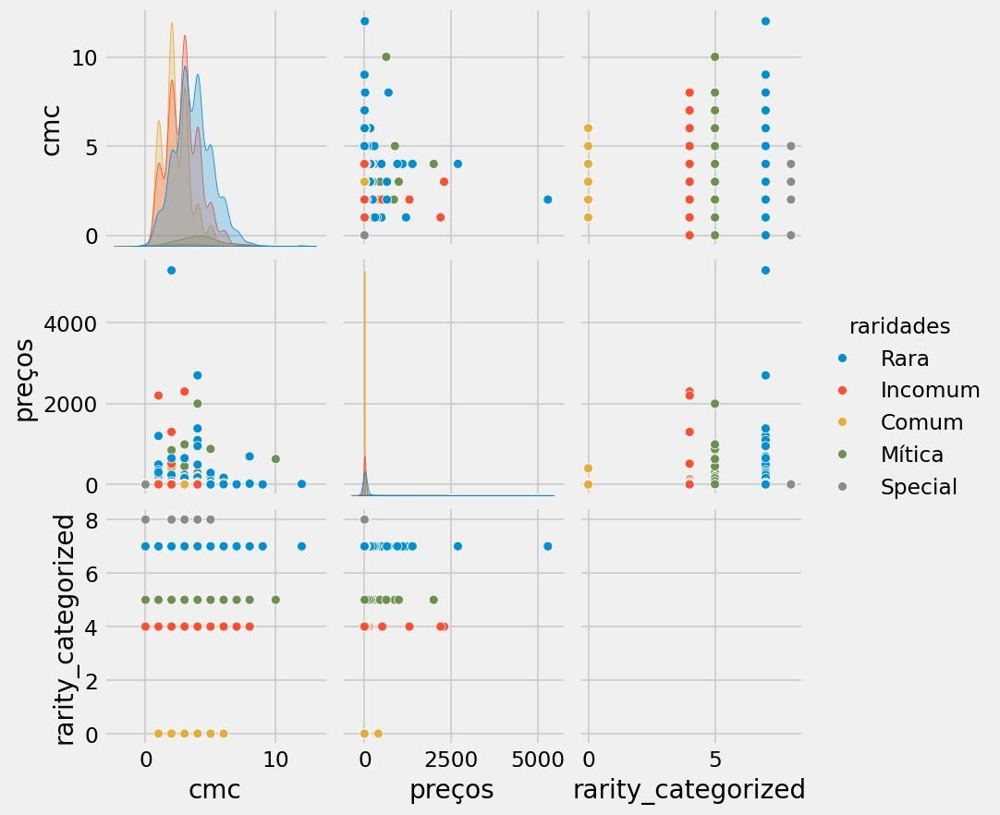

In [ ]:
import seaborn as sns

sns.pairplot(df_enc, hue="raridades")

Clusterização do Texto

In [ ]:
sentences = df_enc.texto.to_list()
embedder = SentenceTransformer("sentence-transformers/all-mpnet-base-v2")
corpus_embeddings = embedder.encode(sentences)
# Normalize the embeddings to unit length
corpus_embeddings = corpus_embeddings / np.linalg.norm(
    corpus_embeddings, axis=1, keepdims=True
)
clustering_model = KMeans(n_clusters=635)
clustering_model.fit(corpus_embeddings)
cluster_assignment = clustering_model.labels_
df_enc["cluster_textclass"] = cluster_assignment

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\2226855862.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Clusterização Geral (Textos + Atributos)

In [ ]:
noatributes = ["tipo", "texto", "preços", "raridades"]
feature = df_enc.drop(columns=[col for col in df_enc if col in noatributes])
target = df_enc["preços"]

In [ ]:
X_train_val, X_test, y_train_val, y_test = train_test_split(
    feature, target, test_size=0.2, random_state=None
)  # hold out 20% of the data for final testing

671
0.6322420230818107


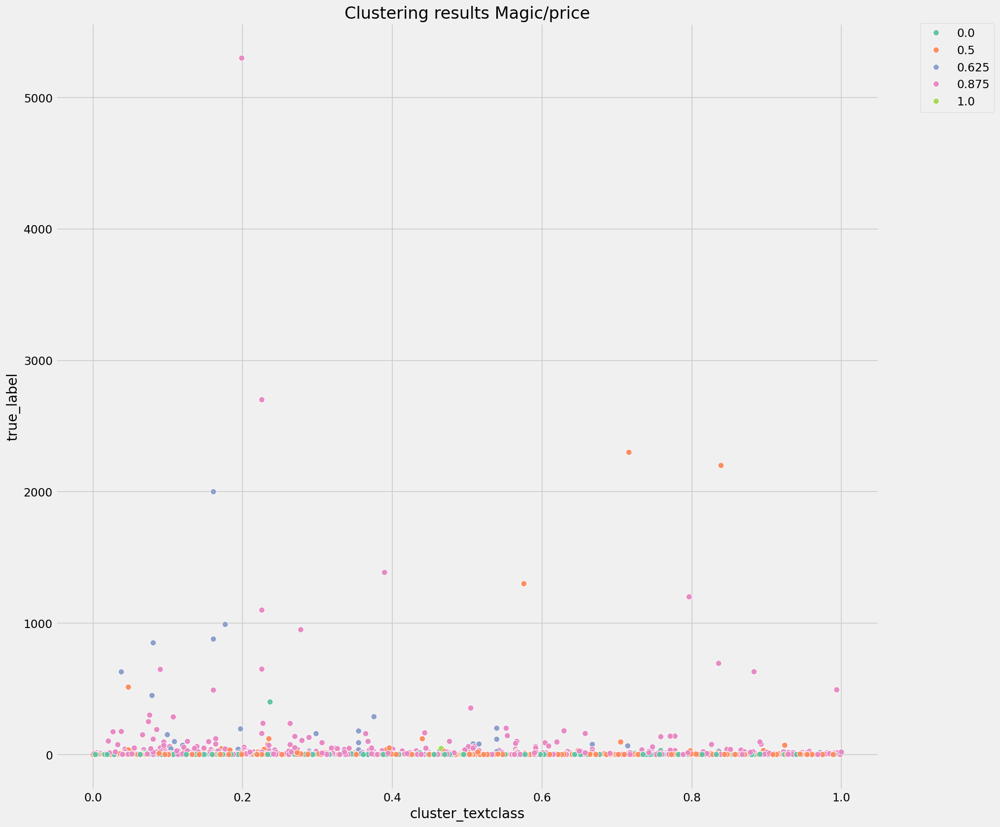

In [ ]:
label_encoder = LabelEncoder()

true_labels = label_encoder.fit_transform(target)
label_encoder.classes_

n_clusters = len(label_encoder.classes_)

print(n_clusters)
preprocessor = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        # ("pca", PCA(n_components=5, random_state=42)),
    ]
)
clusterer = Pipeline(
    [
        (
            "kmeans",
            KMeans(
                n_clusters=n_clusters,
                init="k-means++",
                n_init=50,
                max_iter=500,
                random_state=42,
            ),
        ),
    ]
)
pipe = Pipeline([("preprocessor", preprocessor), ("clusterer", clusterer)])
pipe.fit(feature)
preprocessed_data = pipe["preprocessor"].transform(feature)

predicted_labels = pipe["clusterer"]["kmeans"].labels_

print(silhouette_score(preprocessed_data, predicted_labels))
adjusted_rand_score(true_labels, predicted_labels)
dfcluster = pd.DataFrame(
    pipe["preprocessor"].transform(feature),
    columns=feature.columns,
)

dfcluster["predicted_cluster"] = pipe["clusterer"]["kmeans"].labels_
dfcluster["true_label"] = label_encoder.inverse_transform(true_labels)

plt.style.use("fivethirtyeight")
plt.figure(figsize=(16, 16))

scat = sns.scatterplot(
    data=dfcluster[
        ["cluster_textclass", "predicted_cluster", "true_label", "rarity_categorized"]
    ],
    x="cluster_textclass",
    y="true_label",
    s=50,
    hue="rarity_categorized",
    # style="true_label",
    palette="Set2",
)

scat.set_title("Clustering results Magic/price")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)

plt.show()

In [ ]:
from umap import UMAP
import plotly.express as px

features = dfcluster

umap_2d = UMAP(n_components=2, init="random", random_state=42)
umap_3d = UMAP(n_components=3, init="random", random_state=42)

proj_2d = umap_2d.fit_transform(features)
proj_3d = umap_3d.fit_transform(features)

fig_2d = px.scatter(
    proj_2d,
    x=dfcluster["cluster_textclass"],
    y=dfcluster["predicted_cluster"],
    color=dfcluster["predicted_cluster"],
    labels={"color": "predicted_cluster"},
)
fig_3d = px.scatter_3d(
    proj_3d,
    y=dfcluster["cluster_textclass"],
    x=dfcluster["predicted_cluster"],
    z=dfcluster["true_label"],
    color=dfcluster["predicted_cluster"],
    labels={"color": "predicted_cluster"},
)
fig_3d.update_traces(marker_size=2)

fig_2d.show()
fig_3d.show()

c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.

c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



Previsão do preço

In [ ]:
X_test

,cmc,rarity_categorized,cluster_textclass
name,,,
Infectious Rage,2,4,314
Pilfer,2,4,283
Mob Mentality,1,4,357
Hostile Realm,3,0,58
Hero's Resolve,2,0,79
...,...,...,...
Utopia Vow,2,0,56
Campaign of Vengeance,5,4,100
Ordeal of Heliod,2,4,245


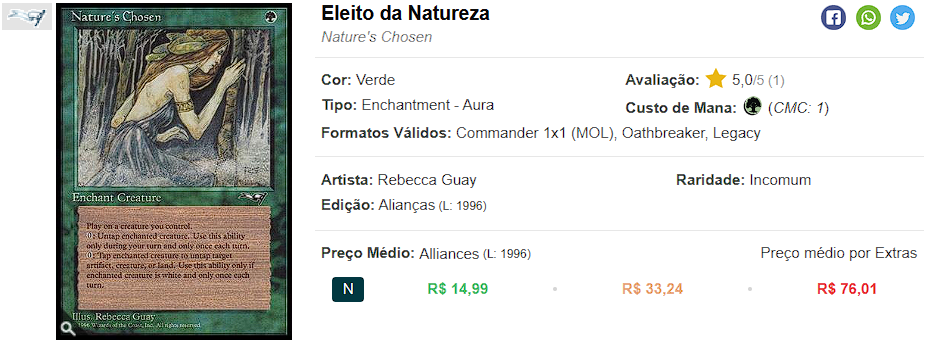

In [ ]:
test_text = "Enchant creature you control {0}: Untap enchanted creature. Activate only during your turn and only once each turn. Tap enchanted creature: Untap target artifact, creature, or land. Activate only if enchanted creature is white and untapped and only once each turn."
textclass = clustering_model.predict(embedder.encode(test_text).reshape(1, -1))
# alterar valores conforme atributos da carta a ser testada e o valor de saída de classificação do texto
valores = [[1, 4, textclass]]

test_input = pd.DataFrame(
    valores,
    columns=["cmc", "rarity_categorized", "cluster_textclass"],
)
dfcluster["true_label"].loc[
    dfcluster["predicted_cluster"] == int(pipe.predict(test_input))
]
from scipy import stats

value_list = dfcluster["true_label"].loc[
    dfcluster["predicted_cluster"] == int(pipe.predict(test_input))
]
stats.bayes_mvs(value_list, 0.908)

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\3673696992.py:11: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\3673696992.py:16: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



(Mean(statistic=inf, minmax=(-43.249409662492134, 58.44940966249209)),
 Variance(statistic=inf, minmax=(27.50656829519651, 32913.66902652998)),
 Std_dev(statistic=inf, minmax=(5.244670465834485, 181.42124745059488)))

Aqui há um claro exemplo de como podemos ver com o desvio padrão de 4.92-39.72 a carta mesmo sendo classificada como 5 o cluster demonstra claramente que é possivel q seja uma carta a não seguir a média e pode estourar até mesmo o max de 20 reais.

# Mágicas Instantâneas 

In [ ]:
df_inst

,tipo,cmc,texto,raridades,preços,rarity_categorized
name,,,,,,
Bandage,Instant,1,Prevent the next 1 damage that would be dealt ...,Comum,0.18,0
Beacon of Immortality,Instant,6,Double target player’s life total. Shuffle Bea...,Rara,14.00,7
Demystify,Instant,1,Destroy target enchantment.,Comum,0.03,0
Hail of Arrows,Instant,1,Hail of Arrows deals X damage divided as you c...,Incomum,0.15,4
Holy Day,Instant,1,Prevent all combat damage that would be dealt ...,Comum,1.25,0
...,...,...,...,...,...,...
Runeflare Trap,Instant — Trap,6,If an opponent drew three or more cards this t...,Incomum,0.04,4
Seismic Shudder,Instant,2,Seismic Shudder deals 1 damage to each creatur...,Comum,0.05,0
Unstable Footing,Instant,1,Kicker {3}{R} (You may pay an additional {3}{R...,Incomum,0.04,4


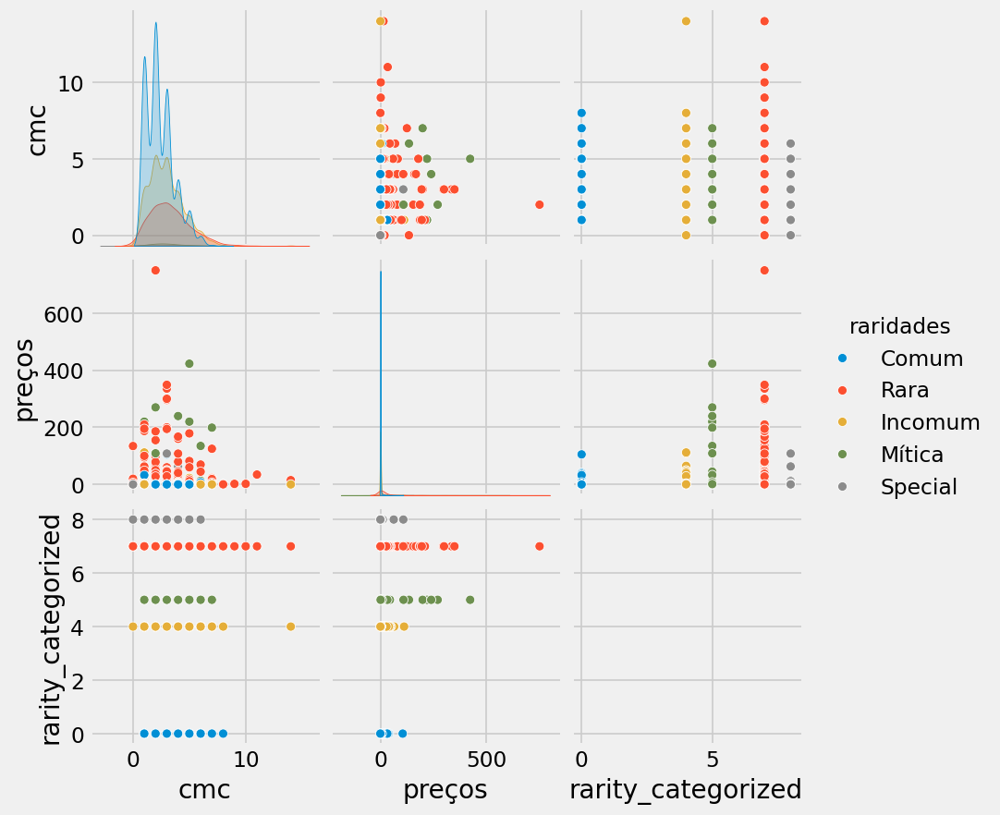

In [ ]:
import seaborn as sns

sns.pairplot(df_inst, hue="raridades")

Clusterização do Texto

In [ ]:
sentences = df_inst.texto.to_list()
embedder = SentenceTransformer("sentence-transformers/all-mpnet-base-v2")
corpus_embeddings = embedder.encode(sentences)
# Normalize the embeddings to unit length
corpus_embeddings = corpus_embeddings / np.linalg.norm(
    corpus_embeddings, axis=1, keepdims=True
)
clustering_model = KMeans(n_clusters=635)
clustering_model.fit(corpus_embeddings)
cluster_assignment = clustering_model.labels_
df_inst["cluster_textclass"] = cluster_assignment

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\2901297342.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Clusterização Geral (textos + atributos)

In [ ]:
noatributes = ["tipo", "texto", "preços", "raridades"]
feature = df_inst.drop(columns=[col for col in df_enc if col in noatributes])
target = df_inst["preços"]
X_train_val, X_test, y_train_val, y_test = train_test_split(
    feature, target, test_size=0.2, random_state=None
)  # hold out 20% of the data for final testing

471
0.6065367594635187


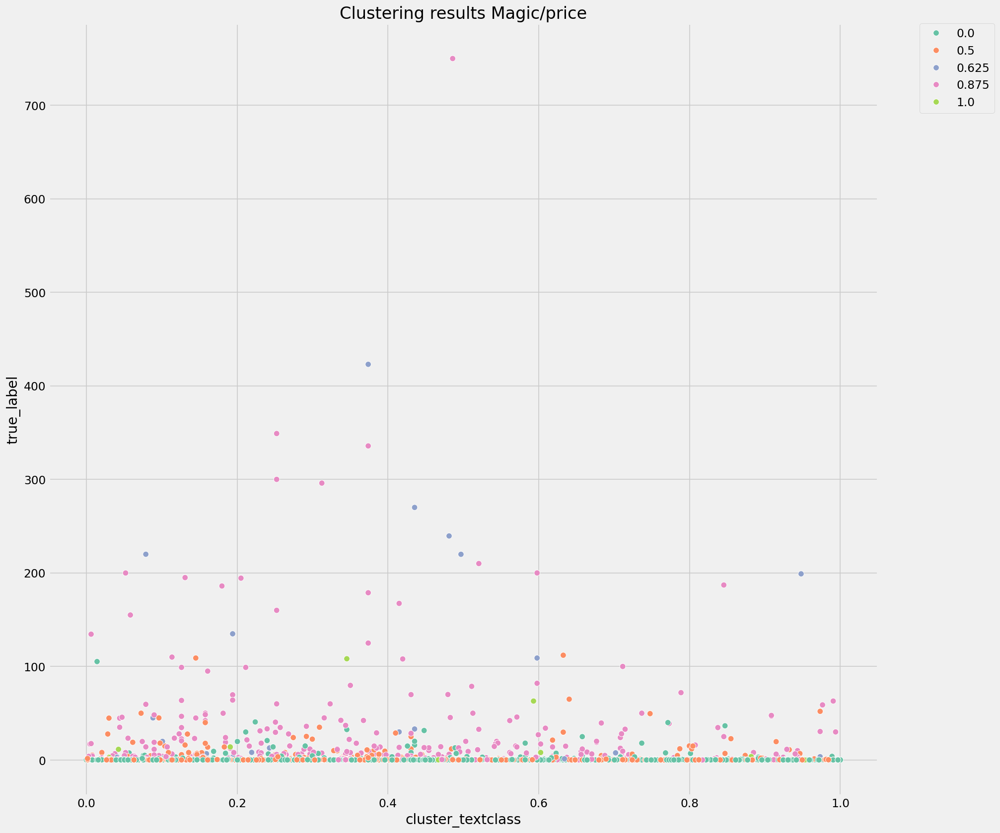

In [ ]:
label_encoder = LabelEncoder()

true_labels = label_encoder.fit_transform(target)
label_encoder.classes_

n_clusters = len(label_encoder.classes_)

print(n_clusters)
preprocessor = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        # ("pca", PCA(n_components=5, random_state=42)),
    ]
)
clusterer = Pipeline(
    [
        (
            "kmeans",
            KMeans(
                n_clusters=n_clusters,
                init="k-means++",
                n_init=50,
                max_iter=500,
                random_state=42,
            ),
        ),
    ]
)
pipe = Pipeline([("preprocessor", preprocessor), ("clusterer", clusterer)])
pipe.fit(feature)
preprocessed_data = pipe["preprocessor"].transform(feature)

predicted_labels = pipe["clusterer"]["kmeans"].labels_

print(silhouette_score(preprocessed_data, predicted_labels))
adjusted_rand_score(true_labels, predicted_labels)
dfcluster = pd.DataFrame(
    pipe["preprocessor"].transform(feature),
    columns=feature.columns,
)

dfcluster["predicted_cluster"] = pipe["clusterer"]["kmeans"].labels_
dfcluster["true_label"] = label_encoder.inverse_transform(true_labels)

plt.style.use("fivethirtyeight")
plt.figure(figsize=(16, 16))

scat = sns.scatterplot(
    data=dfcluster[
        ["cluster_textclass", "predicted_cluster", "true_label", "rarity_categorized"]
    ],
    x="cluster_textclass",
    y="true_label",
    s=50,
    hue="rarity_categorized",
    # style="true_label",
    palette="Set2",
)

scat.set_title("Clustering results Magic/price")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)

plt.show()

In [ ]:
from umap import UMAP
import plotly.express as px

features = dfcluster

umap_2d = UMAP(n_components=2, init="random", random_state=42)
umap_3d = UMAP(n_components=3, init="random", random_state=42)

proj_2d = umap_2d.fit_transform(features)
proj_3d = umap_3d.fit_transform(features)

fig_2d = px.scatter(
    proj_2d,
    x=dfcluster["cluster_textclass"],
    y=dfcluster["predicted_cluster"],
    color=dfcluster["predicted_cluster"],
    labels={"color": "predicted_cluster"},
)
fig_3d = px.scatter_3d(
    proj_3d,
    y=dfcluster["cluster_textclass"],
    x=dfcluster["predicted_cluster"],
    z=dfcluster["true_label"],
    color=dfcluster["predicted_cluster"],
    labels={"color": "predicted_cluster"},
)
fig_3d.update_traces(marker_size=2)

fig_2d.show()
fig_3d.show()

c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.

c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



Previsão do preço

In [ ]:
X_test

,cmc,rarity_categorized,cluster_textclass
name,,,
Silence the Believers,4,7,456
Needle Drop,1,0,487
Disorient,4,0,75
Revivify,3,7,461
Bladebrand,2,0,394
...,...,...,...
Unbounded Potential,2,0,223
Scour the Laboratory,6,4,58
Clinging Mists,3,0,552


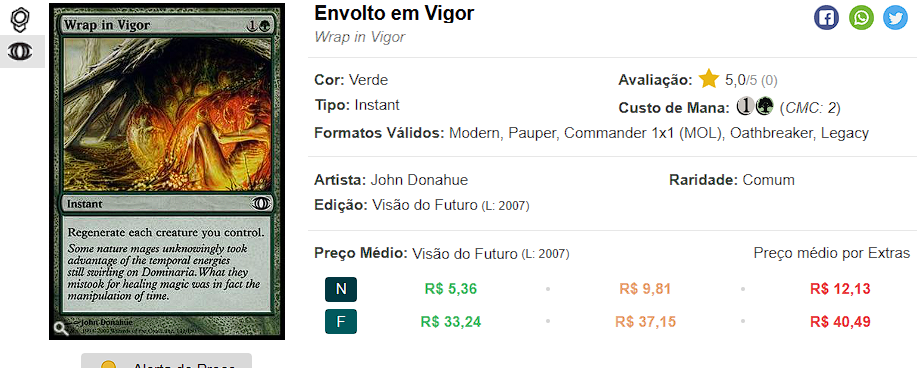

In [ ]:
test_text = "Regenerate each creature you control."
textclass = clustering_model.predict(embedder.encode(test_text).reshape(1, -1))
# alterar valores conforme atributos da carta a ser testada e o valor de saída de classificação do texto
valores = [[2, 0, textclass]]

test_input = pd.DataFrame(
    valores,
    columns=["cmc", "rarity_categorized", "cluster_textclass"],
)
dfcluster["true_label"].loc[
    dfcluster["predicted_cluster"] == int(pipe.predict(test_input))
]
from scipy import stats

value_list = dfcluster["true_label"].loc[
    dfcluster["predicted_cluster"] == int(pipe.predict(test_input))
]
stats.bayes_mvs(value_list, 0.908)

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\2114960442.py:11: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\2114960442.py:16: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



(Mean(statistic=1.5893333333333333, minmax=(-0.3753757931107431, 3.5540424597774094)),
 Variance(statistic=20.646441111111113, minmax=(10.32921266139413, 38.44184829819279)),
 Std_dev(statistic=4.4502579602537535, minmax=(3.2139092490912264, 6.2001490545141555)))

Nesta carta podemos notar como muitas vezes apenas o agrupamento dos vetores de sentença e o custo de mana não serão suficientes para trazer uma predição correta visto que o vetor não tras consigo uma inferência de entendimento do jogo. Porém ainda pelo desvio padrão é possivel notar que a carta pode por semelhança a uma do cluster chegar a 5.83 o que condiz proximamente com a realidade do preço mínimo.

# Terrenos

In [ ]:
df_terr

,tipo,texto,raridades,preços,rarity_categorized
name,,,,,
Stun,Land,"{T}: Add {C}.{3}, {T}: Target creature with po...",Comum,0.15,0
Adarkar Wastes,Land,{T}: Add {C}.{T}: Add {W} or {U}. Adarkar Wast...,Rara,40.00,7
Battlefield Forge,Land,{T}: Add {C}.{T}: Add {R} or {W}. Battlefield ...,Rara,11.44,7
Brushland,Land,{T}: Add {C}.{T}: Add {G} or {W}. Brushland de...,Rara,18.49,7
Caves of Koilos,Land,{T}: Add {C}.{T}: Add {W} or {B}. Caves of Koi...,Rara,6.98,7
...,...,...,...,...,...
Edgewall Inn,Land,Edgewall Inn enters the battlefield tapped.As ...,Incomum,0.17,4
Lotus Vale,Land,"If Lotus Vale would enter the battlefield, sac...",Rara,78.95,7
Scorched Ruins,Land,"If Scorched Ruins would enter the battlefield,...",Rara,107.00,7


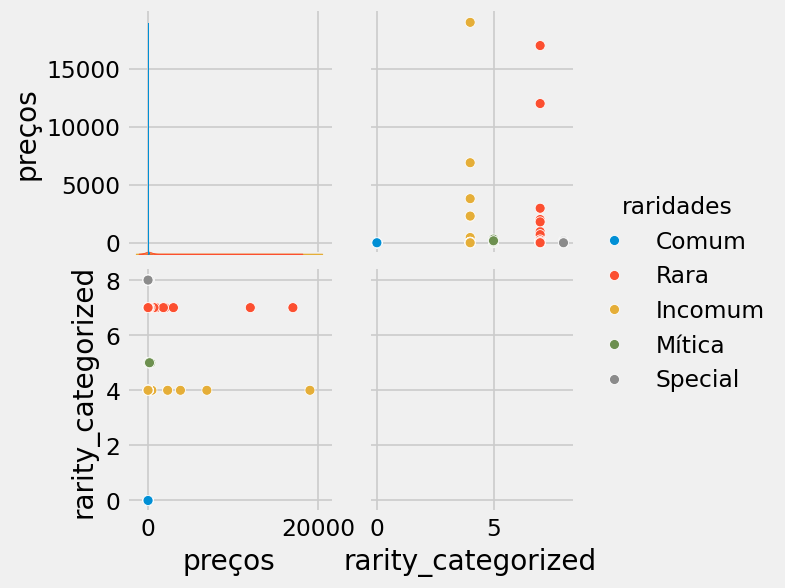

In [ ]:
import seaborn as sns

sns.pairplot(df_terr, hue="raridades")

Clusterização Texto

In [ ]:
sentences = df_terr.texto.to_list()
embedder = SentenceTransformer("sentence-transformers/all-mpnet-base-v2")
corpus_embeddings = embedder.encode(sentences)
# Normalize the embeddings to unit length
corpus_embeddings = corpus_embeddings / np.linalg.norm(
    corpus_embeddings, axis=1, keepdims=True
)
clustering_model = KMeans(n_clusters=635)
clustering_model.fit(corpus_embeddings)
cluster_assignment = clustering_model.labels_
df_terr["cluster_textclass"] = cluster_assignment

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\526857080.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



CLusterização Geral (Texto + atributos) 

In [ ]:
noatributes = ["tipo", "texto", "preços", "raridades"]
feature = df_terr.drop(columns=[col for col in df_enc if col in noatributes])
target = df_terr["preços"]
X_train_val, X_test, y_train_val, y_test = train_test_split(
    feature, target, test_size=0.2, random_state=None
)  # hold out 20% of the data for final testing

388
0.4758968576452317


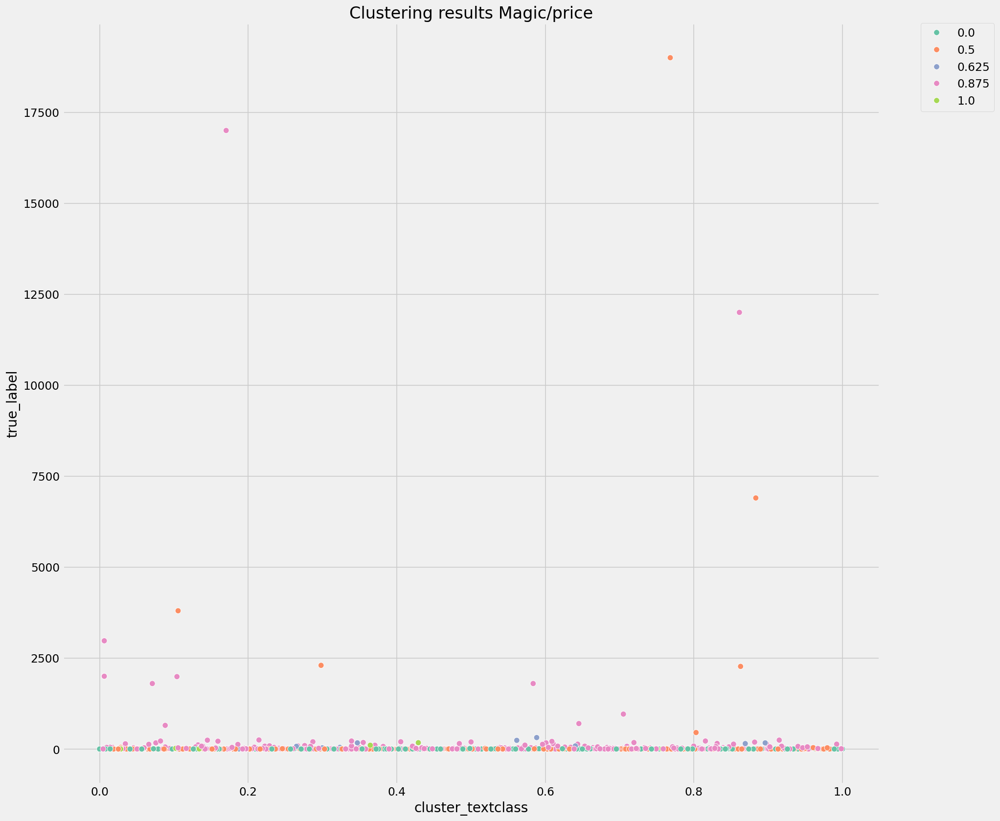

In [ ]:
label_encoder = LabelEncoder()

true_labels = label_encoder.fit_transform(target)
label_encoder.classes_

n_clusters = len(label_encoder.classes_)

print(n_clusters)
preprocessor = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        # ("pca", PCA(n_components=5, random_state=42)),
    ]
)
clusterer = Pipeline(
    [
        (
            "kmeans",
            KMeans(
                n_clusters=n_clusters,
                init="k-means++",
                n_init=50,
                max_iter=500,
                random_state=42,
            ),
        ),
    ]
)
pipe = Pipeline([("preprocessor", preprocessor), ("clusterer", clusterer)])
pipe.fit(feature)
preprocessed_data = pipe["preprocessor"].transform(feature)

predicted_labels = pipe["clusterer"]["kmeans"].labels_

print(silhouette_score(preprocessed_data, predicted_labels))
adjusted_rand_score(true_labels, predicted_labels)
dfcluster = pd.DataFrame(
    pipe["preprocessor"].transform(feature),
    columns=feature.columns,
)

dfcluster["predicted_cluster"] = pipe["clusterer"]["kmeans"].labels_
dfcluster["true_label"] = label_encoder.inverse_transform(true_labels)

plt.style.use("fivethirtyeight")
plt.figure(figsize=(16, 16))

scat = sns.scatterplot(
    data=dfcluster[
        ["cluster_textclass", "predicted_cluster", "true_label", "rarity_categorized"]
    ],
    x="cluster_textclass",
    y="true_label",
    s=50,
    hue="rarity_categorized",
    # style="true_label",
    palette="Set2",
)

scat.set_title("Clustering results Magic/price")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)

plt.show()

In [ ]:
from umap import UMAP
import plotly.express as px

features = dfcluster

umap_2d = UMAP(n_components=2, init="random", random_state=42)
umap_3d = UMAP(n_components=3, init="random", random_state=42)

proj_2d = umap_2d.fit_transform(features)
proj_3d = umap_3d.fit_transform(features)

fig_2d = px.scatter(
    proj_2d,
    x=dfcluster["cluster_textclass"],
    y=dfcluster["predicted_cluster"],
    color=dfcluster["predicted_cluster"],
    labels={"color": "predicted_cluster"},
)
fig_3d = px.scatter_3d(
    proj_3d,
    y=dfcluster["cluster_textclass"],
    x=dfcluster["predicted_cluster"],
    z=dfcluster["true_label"],
    color=dfcluster["predicted_cluster"],
    labels={"color": "predicted_cluster"},
)
fig_3d.update_traces(marker_size=2)

fig_2d.show()
fig_3d.show()

c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.

c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



Previsão do preço

In [ ]:
X_test

,rarity_categorized,cluster_textclass
name,,
Underground River,7,470
Temple of the False God,4,581
Sejiri Steppe,0,102
Mortuary Mire,0,295
Warped Landscape,0,596
...,...,...
Elfhame Palace,4,557
Isolated Watchtower,7,437
Karoo,4,293


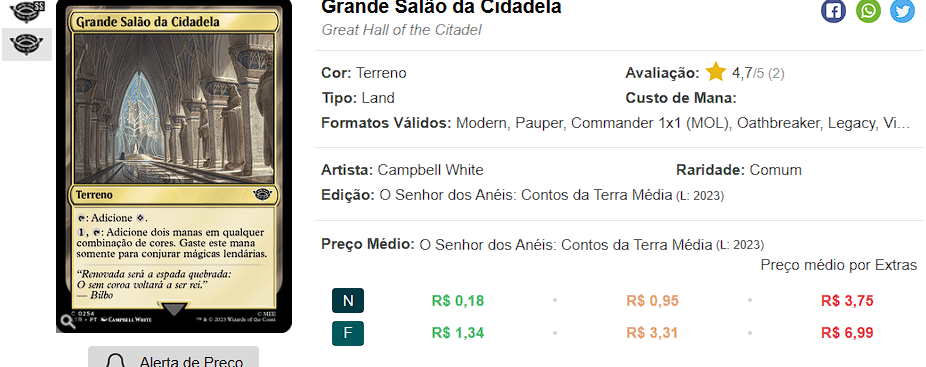

In [ ]:
test_text = ": Adicione {C}.{1}, {T}: Adicione dois manas em qualquer combinação de cores. Gaste este mana somente para conjurar mágicas lendárias."
textclass = clustering_model.predict(embedder.encode(test_text).reshape(1, -1))
# alterar valores conforme atributos da carta a ser testada e o valor de saída de classificação do texto
valores = [[0, textclass]]

test_input = pd.DataFrame(
    valores,
    columns=["rarity_categorized", "cluster_textclass"],
)
dfcluster["true_label"].loc[
    dfcluster["predicted_cluster"] == int(pipe.predict(test_input))
]
from scipy import stats
try:
    value_list = dfcluster["true_label"].loc[
        dfcluster["predicted_cluster"] == int(pipe.predict(test_input))
    ]
    stats.bayes_mvs(value_list, 0.908)
except:
    print(dfcluster["true_label"].loc[
    dfcluster["predicted_cluster"] == int(pipe.predict(test_input))
])

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\4231608374.py:11: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\4231608374.py:16: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



Neste caso é importante notar que foi clusterizado apenas 1 carta e portanto teremos apenas 1 indicação de qual seria o preço da carta. Neste caso a indicação é de 4.5 reais o que não é tão correto mas n foge muito do valor máximo do que o mercado quer pela carta.

# Planeswalker


In [ ]:
df_planes = pd.read_csv("PlaneswalkerCards.csv")

In [ ]:
df_planes.columns
df_planes = df_planes.drop(columns=[col for col in df_planes if col in unwanted_list])
df_planes["rarity_categorized"] = df_planes["raridades"].astype("category").cat.codes


In [ ]:
df_planes

,name,tipo,cmc,lealdade,texto,raridades,preços,rarity_categorized
0,"Ashiok, Nightmare Muse",Legendary Planeswalker — Ashiok,5,Loyalty: 5,+1: Create a 2/3 blue and black Nightmare crea...,Mítica,R$ 18.45,2
1,"Ajani, Sleeper Agent",Legendary Planeswalker — Ajani,4,Loyalty: 4,"Compleated ({G/W/P} can be paid with {G}, {W},...",Mítica,R$ 19.90,2
2,"Liliana, the Last Hope",Legendary Planeswalker — Liliana,3,Loyalty: 3,+1: Up to one target creature gets -2/-1 until...,Mítica,R$ 0.00,2
3,"Aminatou, the Fateshifter",Legendary Planeswalker — Aminatou,3,Loyalty: 3,"+1: Draw a card, then put a card from your han...",Mítica,R$ 229.29,2
4,"Nicol Bolas, God-Pharaoh",Legendary Planeswalker — Bolas,7,Loyalty: 7,+2: Target opponent exiles cards from the top ...,Mítica,R$ 43.99,2
...,...,...,...,...,...,...,...,...
195,"Ashiok, Sculptor of Fears",Legendary Planeswalker — Ashiok,6,Loyalty: 4,+2: Draw a card. Each player mills two cards.−...,Mítica,R$ 12.75,2
196,"Ashiok, Nightmare Weaver",Legendary Planeswalker — Ashiok,3,Loyalty: 3,+2: Exile the top three cards of target oppone...,Mítica,R$ 7.90,2
197,"Jace, Ingenious Mind-Mage",Legendary Planeswalker — Jace,6,Loyalty: 5,+1: Draw a card.+1: Untap all creatures you co...,Mítica,R$ 10.50,2
198,"Huatli, Dinosaur Knight",Legendary Planeswalker — Huatli,6,Loyalty: 4,+2: Put two +1/+1 counters on up to one target...,Mítica,R$ 5.03,2


In [ ]:
df_name = df_planes["name"]
df_planes.drop(columns=["name"], inplace=True)
df_planes.set_index(df_name, inplace=True)

In [ ]:
df_planes['lealdade'] = df_planes.lealdade.str.extract('(\d+)')

<>:1: SyntaxWarning:

invalid escape sequence '\d'

<>:1: SyntaxWarning:

invalid escape sequence '\d'

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\3306483967.py:1: SyntaxWarning:

invalid escape sequence '\d'



In [ ]:
df_planes['lealdade']

name
Ashiok, Nightmare Muse       5
Ajani, Sleeper Agent         4
Liliana, the Last Hope       3
Aminatou, the Fateshifter    3
Nicol Bolas, God-Pharaoh     7
                            ..
Ashiok, Sculptor of Fears    4
Ashiok, Nightmare Weaver     3
Jace, Ingenious Mind-Mage    5
Huatli, Dinosaur Knight      4
Chandra Ablaze               5
Name: lealdade, Length: 200, dtype: object

In [ ]:
df_planes

,tipo,cmc,lealdade,texto,raridades,preços,rarity_categorized
name,,,,,,,
"Ashiok, Nightmare Muse",Legendary Planeswalker — Ashiok,5,5,+1: Create a 2/3 blue and black Nightmare crea...,Mítica,R$ 18.45,2
"Ajani, Sleeper Agent",Legendary Planeswalker — Ajani,4,4,"Compleated ({G/W/P} can be paid with {G}, {W},...",Mítica,R$ 19.90,2
"Liliana, the Last Hope",Legendary Planeswalker — Liliana,3,3,+1: Up to one target creature gets -2/-1 until...,Mítica,R$ 0.00,2
"Aminatou, the Fateshifter",Legendary Planeswalker — Aminatou,3,3,"+1: Draw a card, then put a card from your han...",Mítica,R$ 229.29,2
"Nicol Bolas, God-Pharaoh",Legendary Planeswalker — Bolas,7,7,+2: Target opponent exiles cards from the top ...,Mítica,R$ 43.99,2
...,...,...,...,...,...,...,...
"Ashiok, Sculptor of Fears",Legendary Planeswalker — Ashiok,6,4,+2: Draw a card. Each player mills two cards.−...,Mítica,R$ 12.75,2
"Ashiok, Nightmare Weaver",Legendary Planeswalker — Ashiok,3,3,+2: Exile the top three cards of target oppone...,Mítica,R$ 7.90,2
"Jace, Ingenious Mind-Mage",Legendary Planeswalker — Jace,6,5,+1: Draw a card.+1: Untap all creatures you co...,Mítica,R$ 10.50,2


In [ ]:
change_prices = df_planes.preços.str.strip("R$")
df_planes["preços"] = change_prices
df_planes["preços"] = df_planes["preços"].apply(clean_price)
df_planes["preços"] = df_planes["preços"].astype(float)

In [ ]:
df_planes.describe().T

,count,mean,std,min,25%,50%,75%,max
cmc,200.0,4.65500,1.297843,0.0,4.0000,5.0,6.000,8.0
preços,200.0,44.47775,146.129108,0.0,4.6375,10.7,32.225,1900.0
rarity_categorized,200.0,2.08500,0.445835,0.0,2.0000,2.0,2.000,4.0


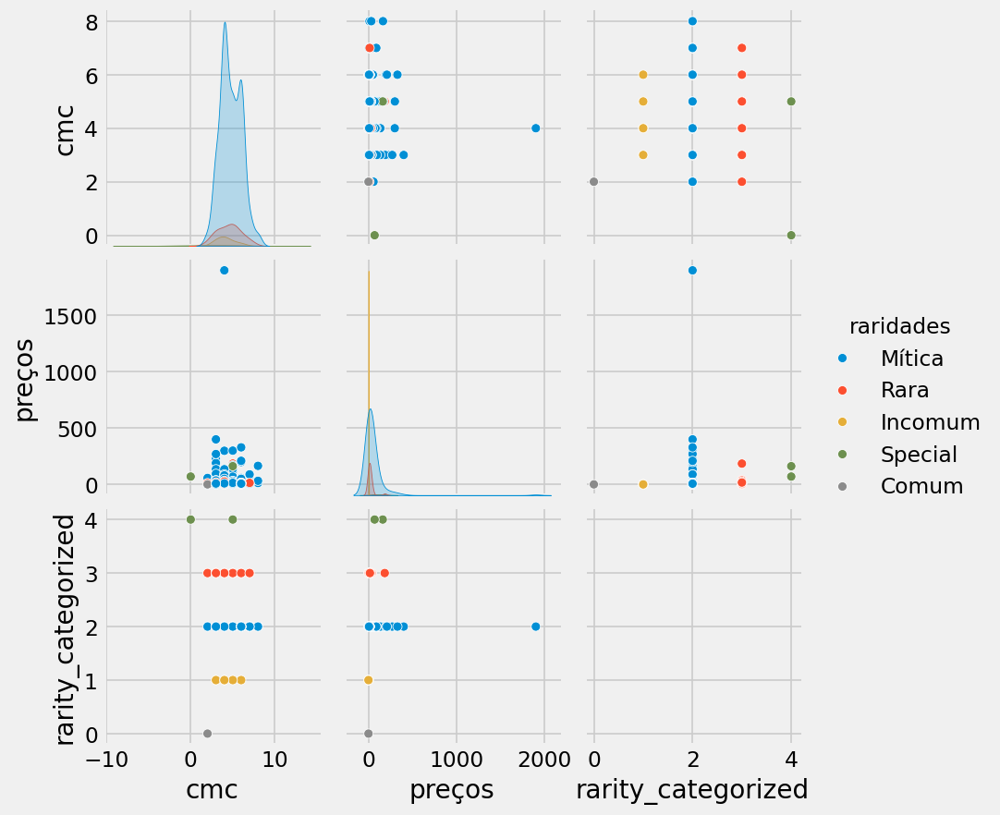

In [ ]:
import seaborn as sns

sns.pairplot(df_planes, hue="raridades")

In [ ]:
df_planes["texto"].replace(r"\s+|\\n", " ", regex=True, inplace=True)
df_planes.dropna(inplace=True)

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\4224786021.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [ ]:
sentences = df_planes.texto.to_list()
embedder = SentenceTransformer("sentence-transformers/all-mpnet-base-v2")
corpus_embeddings = embedder.encode(sentences)
# Normalize the embeddings to unit length
corpus_embeddings = corpus_embeddings / np.linalg.norm(
    corpus_embeddings, axis=1, keepdims=True
)
clustering_model = KMeans(n_clusters=169)
clustering_model.fit(corpus_embeddings)
cluster_assignment = clustering_model.labels_
df_planes["cluster_textclass"] = cluster_assignment

In [ ]:
noatributes = ["tipo", "texto", "preços", "raridades"]
feature = df_planes.drop(columns=[col for col in df_planes if col in noatributes])
target = df_planes["preços"]

169
0.2195905707866289


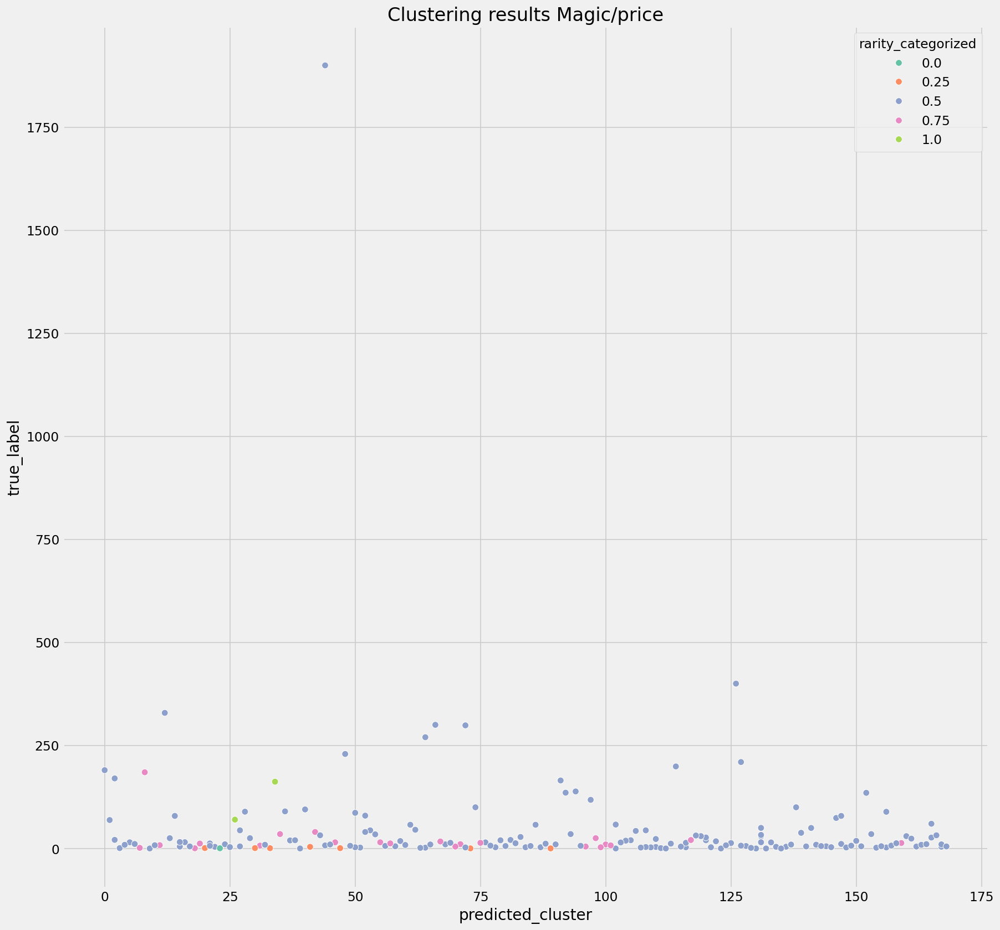

In [ ]:
X_train_val, X_test, y_train_val, y_test = train_test_split(
    feature, target, test_size=None, random_state=None
)  # hold out 10% of the data for final testing
label_encoder = LabelEncoder()

true_labels = label_encoder.fit_transform(target)
label_encoder.classes_

n_clusters = len(label_encoder.classes_)

print(n_clusters)
preprocessor = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        #("pca", PCA(n_components=4, random_state=42)),

    ]
)
clusterer = Pipeline(
    [
        (
            "kmeans",
            KMeans(
                n_clusters=n_clusters,
                init="k-means++",
                n_init=100,
                max_iter=10000,
                random_state=42,
            )
        ),
    ]
)
pipe = Pipeline([("preprocessor", preprocessor), ("clusterer", clusterer)])
pipe.fit(feature)
preprocessed_data = pipe["preprocessor"].transform(feature)

predicted_labels = pipe["clusterer"]["kmeans"].labels_


print(silhouette_score(preprocessed_data, predicted_labels))
adjusted_rand_score(true_labels, predicted_labels)
plt.rcParams["figure.dpi"] = 120
dfcluster = pd.DataFrame(
    pipe["preprocessor"].transform(feature),
    columns=feature.columns,
)

dfcluster["predicted_cluster"] = pipe["clusterer"]["kmeans"].labels_
dfcluster["true_label"] = label_encoder.inverse_transform(true_labels)

plt.style.use("fivethirtyeight")
plt.figure(figsize=(16, 16))

scat = sns.scatterplot(
    data=dfcluster[
        ["predicted_cluster", "true_label",'cluster_textclass',"rarity_categorized"]
    ],
    x="predicted_cluster",
    y="true_label",
    s=50,
    hue="rarity_categorized",
    # style="true_label",
    palette="Set2",
)

scat.set_title("Clustering results Magic/price")

plt.show()

In [ ]:
from umap import UMAP
import plotly.express as px

features = dfcluster

umap_2d = UMAP(n_components=2, init="random", random_state=42)
umap_3d = UMAP(n_components=3, init="random", random_state=42)

proj_2d = umap_2d.fit_transform(features)
proj_3d = umap_3d.fit_transform(features)

fig_2d = px.scatter(
    proj_2d,
    x=dfcluster["cluster_textclass"],
    y=dfcluster["predicted_cluster"],
    color=dfcluster["predicted_cluster"],
    labels={"color": "predicted_cluster"},
)
fig_3d = px.scatter_3d(
    proj_3d,
    y=dfcluster["cluster_textclass"],
    x=dfcluster["predicted_cluster"],
    z=dfcluster["true_label"],
    color=dfcluster["predicted_cluster"],
    labels={"color": "predicted_cluster"},
)
fig_3d.update_traces(marker_size=2)

fig_2d.show()
fig_3d.show()

c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.

c:\Users\drodm\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [ ]:
X_test

,cmc,lealdade,rarity_categorized,cluster_textclass
name,,,,
"Ajani, Sleeper Agent",4,4,2,11
"Teferi, Hero of Dominaria",5,4,4,70
"Tamiyo, Field Researcher",4,4,2,57
"Kaito, Dancing Shadow",4,3,3,0
"Ajani, Mentor of Heroes",5,4,2,147
"Chandra, Legacy of Fire",5,3,3,26
"Vronos, Masked Inquisitor",5,5,3,63
"Liliana, Death Mage",6,4,2,1
"Ugin, the Ineffable",6,4,3,23


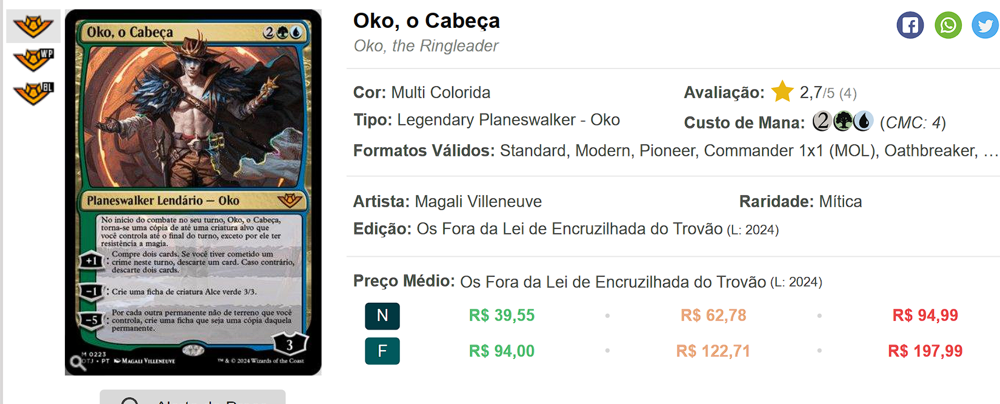

In [ ]:
test_text = "At the beginning of combat on your turn, Oko, the Ringleader becomes a copy of up to one target creature you control until end of turn, except he has hexproof. +1: Draw two cards. If you’ve committed a crime this turn, discard a card. Otherwise, discard two cards. −1: Create a 3/3 green Elk creature token. −5: For each other nonland permanent you control, create a token that’s a copy of that permanent."
textclass = clustering_model.predict(embedder.encode(test_text).reshape(1, -1))
# alterar valores conforme atributos da carta a ser testada e o valor de saída de classificação do texto
valores = [[4, 3, 2,textclass]]
print(textclass)
test_input = pd.DataFrame(
    valores,
    columns=["cmc","lealdade","rarity_categorized", "cluster_textclass"],
)
dfcluster["true_label"].loc[
    dfcluster["predicted_cluster"] == int(pipe.predict(test_input))
]
value_list = dfcluster["true_label"].loc[
        dfcluster["predicted_cluster"] == int(pipe.predict(test_input))
    ]
#stats.bayes_mvs(value_list, 0.908)
print(dfcluster["true_label"].loc[
dfcluster["predicted_cluster"] == int(pipe.predict(test_input))])

[102]
18    3.99
Name: true_label, dtype: float64


C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\228944111.py:11: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\228944111.py:14: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

C:\Users\drodm\AppData\Local\Temp\ipykernel_19124\228944111.py:18: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

